---

In [56]:
#| code-fold: true

# Imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torchvision
from torchvision import transforms

# Set global random seeds for both numpy and Python's random - This is useless in ipynb we need to set randomstate before every
# random operation
np.random.seed(42)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

---

::: {.callout-note appearance="simple" collapse="true"}
## Explore the resources that inspired this post

<a href="https://betterexplained.com/articles/intuitive-convolution/">https://betterexplained.com/articles/intuitive-convolution/</a> - A great resource, some of the examples I give are adapted from this post.

<a href="https://cs231n.github.io/convolutional-networks/#conv">https://cs231n.github.io/convolutional-networks/#conv</a> A great coverage of CNNs, check out the whole course too.

<a href="https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf">https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf</a> The AlexNet paper, one of the most important milestones for CNNs.

<a href="https://www.deeplearningbook.org/contents/convnets.html">https://www.deeplearningbook.org/contents/convnets.html</a> The age old classic book for deep learning.

<a href="https://sgugger.github.io/convolution-in-depth.html">https://sgugger.github.io/convolution-in-depth.html</a> A brilliant blog showcasing the CNN.

<a href="https://petewarden.com/2015/04/20/why-gemm-is-at-the-heart-of-deep-learning/">https://petewarden.com/2015/04/20/why-gemm-is-at-the-heart-of-deep-learning/</a> My introduction to GEMM and cuDNN

<a href="https://leonardoaraujosantos.gitbook.io/artificial-inteligence/machine_learning/deep_learning/convolution_layer/making_faster">https://leonardoaraujosantos.gitbook.io/artificial-inteligence/machine_learning/deep_learning/convolution_layer/making_faster</a> Another great post about im2col

<a href="https://arxiv.org/pdf/1410.0759">https://arxiv.org/pdf/1410.0759</a> The original cuDNN paper from Nvidia. A great read.

<a href="https://en.wikipedia.org/wiki/Basic_Linear_Algebra_Subprograms#">https://en.wikipedia.org/wiki/Basic_Linear_Algebra_Subprograms#</a>

<a href="https://uk.mathworks.com/help/images/ref/im2col.html">https://uk.mathworks.com/help/images/ref/im2col.html</a> Im2col was originally from matlab.

<a href="https://fabianfuchsml.github.io/equivariance1of2/">https://fabianfuchsml.github.io/equivariance1of2/</a> An in depth explanation of equivariance to translation.

<a href="https://en.wikipedia.org/wiki/Cross-correlation#Cross-correlation_function_2">https://en.wikipedia.org/wiki/Cross-correlation#Cross-correlation_function_2</a>

<a href="https://www.iro.umontreal.ca/~mignotte/IFT3205/Documents/UnderstandingDigitalSignalProcessing.pdf">https://www.iro.umontreal.ca/~mignotte/IFT3205/Documents/UnderstandingDigitalSignalProcessing.pdf</a>

<a href="https://setosa.io/ev/image-kernels/">https://setosa.io/ev/image-kernels/</a> A great intuitive animation on kernels.

<a href="https://poloclub.github.io/cnn-explainer/">https://poloclub.github.io/cnn-explainer/</a> A beautiful visualisation of CNNs.

:::

---

Lately, I've used convolutional layers a lot and it occurred to me that I knew very little about the underlying convolution operation, except that it makes use of sliding windows and does some sort of filtering. In this post I chronicle my journey to understand the convolution from first principles. I hope you enjoy reading the post as much as I did writing it :)

The journey begins and ends with Convolutional Neural Networks (CNNs). By definition any neural network which makes use of the convolutional layer is a Convolutional Neural Network (CNN). The "convolution", seems pretty important right? As it turns out it precedes the CNN, and is a pretty cool mathematical operation in its own right. 

So, let's explore the convolution, figure out how it works and its place within CNNs.

## Moving Averages - John the Programmer

Let's kick off things nice and easy, with one of the most ubiquitous filters around...

Here's the scenario, John is a programmer and we measure his productivity by the number of Lines of Code (LoC) he adds or removes from the code base. Too bad we lost track of his actual data, so we will be a little mean and sample it from a normal distribution (pun intended). A positive number represents an addition of LoC to the codebase and a negative number represents a removal.

In [5]:
np.random.seed(42)  # any integer can be used as the seed
# Let's assume John's LoC per hour follows a Normal distribution with
# mean=50 and standard deviaton=50, also John is a real workhorse in this session
# he programmed non-stop for 50 hours!
lines_of_code = np.random.normal(50, 50, 50)
print(lines_of_code)

[ 74.83570765  43.08678494  82.38442691 126.15149282  38.29233126
  38.29315215 128.96064078  88.37173646  26.5262807   77.12800218
  26.82911536  26.71351232  62.09811358 -45.66401223 -36.24589163
  21.88562354  -0.64155602  65.71236663   4.59879622 -20.61518507
 123.28243845  38.71118498  53.37641023 -21.23740931  22.78086377
  55.54612949  -7.54967887  68.78490092  19.9680655   35.41531251
  19.91466939 142.61390923  49.32513876  -2.88554645  91.12724561
 -11.0421825   60.44317975 -47.98350619 -16.40930244  59.84306179
  86.923329    58.56841406  44.21758588  34.94481522 -23.92609952
  14.00778958  26.96806145 102.85611131  67.18091448 -38.15200777]


Let's visualise his output.

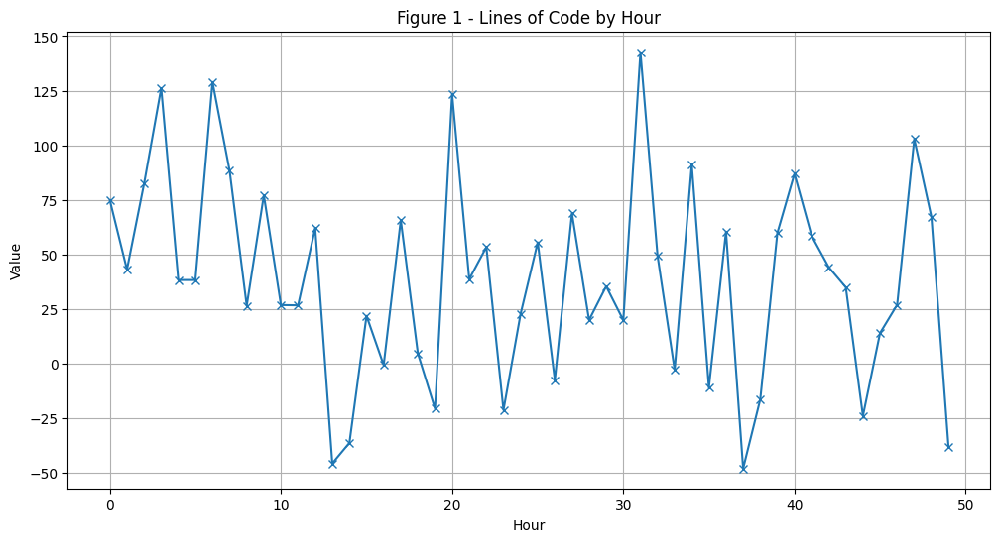

In [57]:
#| code-fold: true

hours = np.arange(len(lines_of_code))

plt.figure(figsize=(12, 6))
plt.plot(hours, lines_of_code, marker='x')
plt.title('Figure 1 - Lines of Code by Hour')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.grid(True)
plt.show()

In [7]:
lines_of_code.mean()

38.726304737193

Looking into John's LoC data, he produces around 39 LoC per hour. However, looking at hourly snapshots alone can be misleading. For example, take hour 16 we might say John was very unproductive producing nothing in that hour! However, this granular view fails to capture that John was very productive in the previous 2 hours (John doesn't like hourly based reviews either). 

John's output varies significantly from hour-to-hour, making an assessment of him by observing any one point quite unfair. To get a more accurate assessment we should look at his output over a wider period. Let's take 3 hours as our period, this could be done by summing his output over 3 hour periods, let's look into that: 

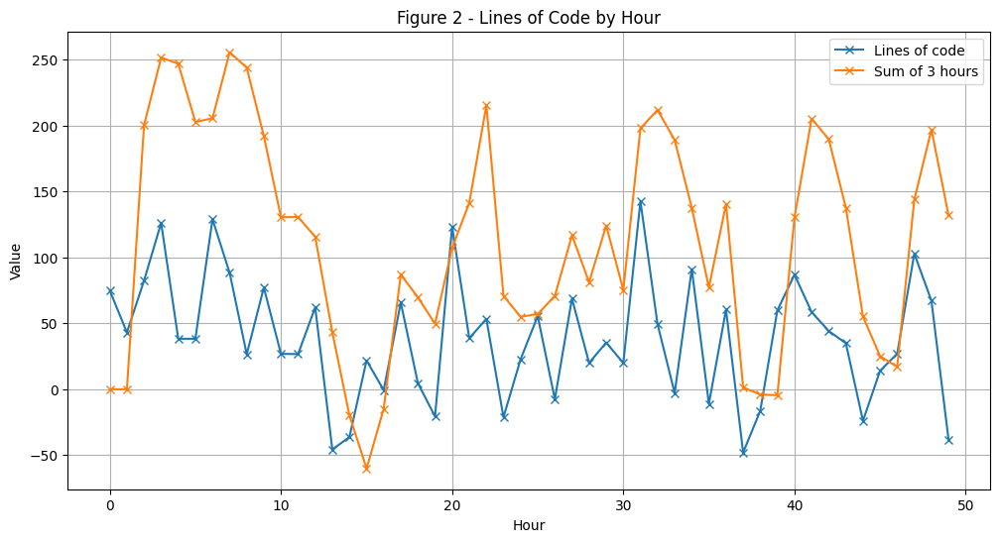

In [8]:
def sum_n(n):
    if n == 0 or n == 1:
        y_n = 0
        return y_n
    
    y_n = lines_of_code[n-2] + lines_of_code[n-1] + lines_of_code[n]
    
    return y_n

sum_lines_code_past_3_hours = []

for i in range(len(lines_of_code)):
    sum_lines_code_past_3_hours.append(sum_n(i))

hours = np.arange(len(lines_of_code))

plt.figure(figsize=(12, 6))
plt.plot(hours, lines_of_code, marker='x', label='Lines of code')
plt.plot(hours, sum_lines_code_past_3_hours, marker='x', label='Sum of 3 hours')
plt.title('Figure 2 - Lines of Code by Hour')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.grid(True)
plt.legend()  # Add the legend
plt.show()

Wait a minute... this doesn't look right. The new graph is confusing, it's not clear where removals take place and the overall behaviour seems to be messed up. The problem is by simply summing we've changed the scale of the data completely - we're now showing the output over 3 hours. To rectify this we can divide each summation by 3 to get the <b>Moving Average (MA)</b> of the data. The MA tells us John's average hourly output over 3 hours, which is exactly what we want. Then we can directly compare this MA with the original data!

Let's perform this operation and take a look at the output.

### Moving Averages

First a look at the math behind the MA, I promise this'll be fun!

---

#### The Math Behind MAs

The moving average is a type of filter, specifically a linear filter (from the signal processing field). A linear filter removes certain frequencies and allows others to pass through. There are many types of linear filter but the MA is a low-pass linear filter. Such a filter allows low frequencies to pass through and reduces the effect of (attenuates) high frequencies. In essence, we remove the peaks and troughs and smooth the data.

What do we mean by frequencies? In signal processing frequency typically refers to the speed at which a signal changes. Here we're working with a time series, so we can take frequency to mean the rate of change in our series (namely the rate of change of John's output). A low frequency occurs when the rate of change between points is low and vice versa for a high frequency. This gets us to why MA is a linear low-pass filter, its effect is to reduce the influence of any one point, by averaging we pull values into a tighter range.

#### Equation Time!

For John we want to average over 3 hours of input data, namely the previous 3 hours.

So, let's take the 3rd datapoint in our lines of code series (to keep things simple I refer to this as $x$ below and the MA data is represented by the array $y$).

$$
y[2] = \frac{1}{3}x[0] + \frac{1}{3}x[1] + \frac{1}{3}x[2] \tag{1}
$$

We can then generalise this to calculate the MA for any data point in our series:

$$
y[n] = \frac{1}{3}(x[n{-}2] + x[n{-}1] + x[n]) \tag{2} \\
$$
$$
y[n] = \frac{1}{3}\sum\limits_{k=n{-}2}^{n}x[k] \tag{3}
$$

We can use this to calculate the 3 period MA at any point in the data. You could change this to work with any period, just edit the index range in the sum and the division before the sum. Note, this may seem a bit foreign at the moment but it will come into play shortly when we take a look at cross-correlation and convolution!

Lastly, the choice of the kernel values in an MA is not up to us, we choose the time period to filter but that forces the filter to have values 1/t with t items, where t is the period we average over, this ensures the filter sums to 1. We have t=3 and filter = \[1/3, 1/3, 1/3\], if we wanted t=5 the filter would be \[1/5, 1/5, 1/5, 1/5, 1/5\]. Doing this retains the scale of our data, preventing what happened earlier when we only summed the terms.

---

I just introduced a new term "kernel", throughout the post I will use filter or kernel interchangeably. The filter and the kernel refer to the same thing - the set of weights applied to the data (here that being \[1/3, 1/3, 1/3\]).

#### Implementing the Moving Average

Now we understand the math, we can implement the MA. The most important idea here is the sliding window, this idea will crop up many times in this post. The idea in question being: that we slide a kernel across our data and calculate the average at each point. This operation will become clearer when we look at kernels which have different values in them, whereas now we have just $\frac{1}{3}$ so bear with me. Nevertheless let's look at a quick example.

Take the first 5 points of data. (run lines_of_code[0:5] to get your first 5 lines)

    lines_of_code[0:5] = [74.84,  43.09,  82.38, 126.15, 38.30]
    kernel = 1/3
    
    y(0) = 0
    y(1) = 0
    y(2) = 1/3(74.84 + 43.09 + 82.38)
    y(3) = 1/3(43.09 + 82.38 + 126.15)
    y(4) = 1/3(82.38 + 126.15 + 38.30)
    
y(0) and y(1) are 0 because they are undefined, at these points we don't have n-2 values before them. This is a problem in MA's. The first data points are always 0 until we have in our case n-2 and in the general case it would be n - m, where m = window_size - 1. We can deal with this by either setting them to 0 or you can copy the first valid MA number into the undefined values.

y(2), y(3) and y(4) are where things get interesting. These, y(2), y(3), ..., y(n) are the outputs of our windows. Take the last value in the MA calculation for y(2) 82.38, notice how it shifts to the left one position at a time in the subsequent calculations. This is what we mean by sliding window. Now, let's take a look at how to implement it!

In [9]:
# We have a function to perform the multiplication and summation
# It takes a parameter n, the index of the current number
def avg_loc(n):
    # The average is undefined for the first 2 points as we do not yet have 3 numbers to average
    if n == 0 or n == 1:
        y_n = 0
        return y_n
    
    y_n = (1/3)*(lines_of_code[n-2] + lines_of_code[n-1] + lines_of_code[n])
    
    return y_n

avg_lines_code_past_3_hours = []

# This for loop implements the summation from equation (3)
for i in range(len(lines_of_code)):
    avg_lines_code_past_3_hours.append(avg_loc(i))

Let's take a look at the MA plot.

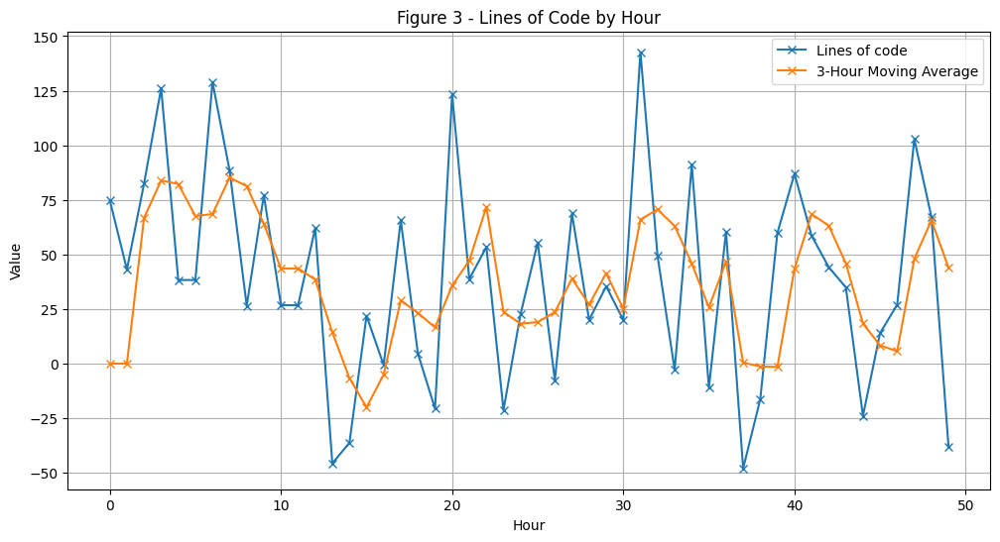

In [10]:
#| code-fold: true

hours = np.arange(len(lines_of_code))

plt.figure(figsize=(12, 6))
plt.plot(hours, lines_of_code, marker='x', label='Lines of code')
plt.plot(hours, avg_lines_code_past_3_hours, marker='x', label='3-Hour Moving Average')
plt.title('Figure 3 - Lines of Code by Hour')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.grid(True)
plt.legend()
plt.show()

We can observe the MA's low pass filtering at play. The MA (orange line) is smoother than the original (blue line). The MA has removed the large spikes in John's output, which causes the smoothing, indicating we have removed some of the noise and made the overall trend clearer to see. So, on a 3 hour scale John's output is more stable and may be a fairer way to assess him (John sure is happy right now!).

Let's take a deeper look at the first 6 hours of John's output to understand the effect of smoothing.

In [11]:
lines_of_code[0:6]

array([ 74.83570765,  43.08678494,  82.38442691, 126.15149282,
        38.29233126,  38.29315215])

The MA's effect on each point then is as follows:

In [12]:
print(f'0 -> 3 : {lines_of_code[0:3]} -> {sum(lines_of_code[0:3])/3}')
print(f'1 -> 4 : {lines_of_code[1:4]} -> {sum(lines_of_code[1:4])/3}')
print(f'2 -> 5 : {lines_of_code[2:5]} -> {sum(lines_of_code[2:5])/3}')
print(f'3 -> 6 : {lines_of_code[3:6]} -> {sum(lines_of_code[3:6])/3}')

0 -> 3 : [74.83570765 43.08678494 82.38442691] -> 66.76897316567901
1 -> 4 : [ 43.08678494  82.38442691 126.15149282] -> 83.87423488895888
2 -> 5 : [ 82.38442691 126.15149282  38.29233126] -> 82.2760836630897
3 -> 6 : [126.15149282  38.29233126  38.29315215] -> 67.57899207892514


You can plainly see the smoothing taking place here. Take indices 2 -> 5 the greatest difference between the lowest and highest value in the window is 87.86 (between 126.15 and 38.29). After taking the MA we get 82.28, now the distance between 38.29 (lowest value) and MA is 43.99 and the distance from 126.15 (highest point) to the MA is 43.87. In essence the MA balanced out the extremes in this window! Rather than focusing on small fluctuations we can look at the overall trend (i.e. despite John being distracted by Alex in hour 5 we can assess his output over the hours where he was locked in).

This is what makes the MA so powerful, it allows us to disregard the moment to moment fluctuations and observe long-term trends.

---

#### An aside - The Low-Pass Filter

Attenuation is a reduction in signal strength, for us it is the smoothing effect where we sort of chop off the highs and lows of our data. The chopping off is determined by the cutoff frequency, it constitutes what is a low signal which we let pass and the high signals which get attenuated. 

To decide which signals get attenuated, in an MA, we use the following equation:

$$
\text{fc} = \frac{0.443}{N*T}
$$

Where N = 3 (number of periods we want to average) and T = 1 (sampling period).

So, $\text{fc} = \frac{0.443}{3*1} = 0.148$ is our cut off frequency. It means that our cutoff is 0.148 cycles per hour and a cycle repeats every $1/0.148=6.75$ hour. So a pattern which repeats faster than every 6.75 hours will get attenuated. The amount of attenuation is a convention in signal processing, at the cutoff frequency we will reduce a signal to 70.7% of its strength (reducing the rate of change of our data). If it repeats faster than every 6.75 hours it will get attenuated more and less if it repeats slower than every 6.75 hours. This reduction of signal strength is what causes the smoothing while allowing long term trends to persist.

From the example we used above take hours 4 -> 5, the change between them is $126.15 - 38.29 = 87.86$. Then from the MA points 4 -> 5 the change is $83.87 - 82.28 = 1.59$. Then, the percentage of reduction is given by: $(87.86-1.59)/87.86 * 100 = 98.19%$. Meaning the signal was reduced to 1.81% of its signal strength, indicating the signal here repeats faster than every 6.75 hours. Put simply, the change of 87.86 represents a very rapid change in one hour, which is much faster than the 6.75 hour cutoff, causing a large reduction in its rate of change after the MA.

Disclaimer: I am not well versed in this field, if you know more about cutoff frequencies and how they work please let me know.

---

And that's the moving average a simple yet powerful filter.

Oh shucks, John's company have implemented a new review process! Any change made by John must now be reviewed before being pushed to the code base. In total the review takes 2 hours, changes made by John are tested and checked by his team. After this the code is stable, tests passed, bugs squashed and code pushed to the main branch. Therefore, we may assume that changes from 2 hours ago are a more meaningful estimation of John's output, rather than recent unvetted changes. 

Can we modify our MA to apply more weight to the tested changes?

---

### The Weighted Moving Average

<b>Weighted Moving Averages (WMA)</b> are your answer! Unlike the uniform filter \[1/3, 1/3, 1/3\] we used before, WMAs assign different weights to each value, giving greater importance to specific points in our data. We want code which passed the review process to be emphasized, so we design a new weighted filter: \[1/2, 1/3, 1/6\]. With this the first (t-2) value in any three hour window will have a larger impact on the output of the WMA. Let's see it in action!

#### The Math Behind WMAs

Like the MA, the central part of WMA is the kernel. The MA has a uniform kernel: $[\frac{1}{3}, \frac{1}{3}, \frac{1}{3}]$. Whereas the WMA has a non-uniform kernel $[\frac{1}{2}, \frac{1}{3}, \frac{1}{6}]$.

Previously, for each window we sum the 3 numbers and then multiply by the 1 over the length of that window ($1/3$ or $1/n$ where n = length of kernel). In a WMA we can't do that as the kernel is not uniform. We need a method to multiply two vectors and sum the result, luckily for us this operation exists and it's called the dot product: $a\cdot b = \sum\limits_{i=1}^{n}a[i]b[i]$. The plan is to take our kernel, slide it over the data and compute the dot product for each of the points. Note, for a dot product both arrays must have the same length which for us would be 3 for the window and 3 for the filter (it works in the general case too). Then to get $y[n]$:

$$
y[n] = \sum\limits_{i=0}^{2}x[n-(2-i)]f[i], \text{where x is the window and f is the kernel}
$$

And we do so for each n point in our LoC series. The operation is called a sliding window dot product. The $n-(2-i)$ indexing of x ensures we look back in time at our data.

#### Implementing the WMA

In [13]:
# We pass in a kernel this time, this function will work for any kernel
def weighted_avg_loc(n, kernel):
    # The average is undefined for the first n-1 points as we do not yet have n numbers to average
    if n < len(kernel)-1:
        y_n = 0
        return y_n
    
    y_n = 0
    # The dot product is essentially a series of multiplications followed by a sum
    for i in range(len(kernel)):
        y_n += (kernel[i]*lines_of_code[n-(2-i)])
    
    return y_n.astype(int)

In [14]:
weighted_avg_lines_code_past_3_hours = []

for i in range(len(lines_of_code)):
    weighted_avg_lines_code_past_3_hours.append(weighted_avg_loc(i, kernel=[1/2, 1/3, 1/6]))

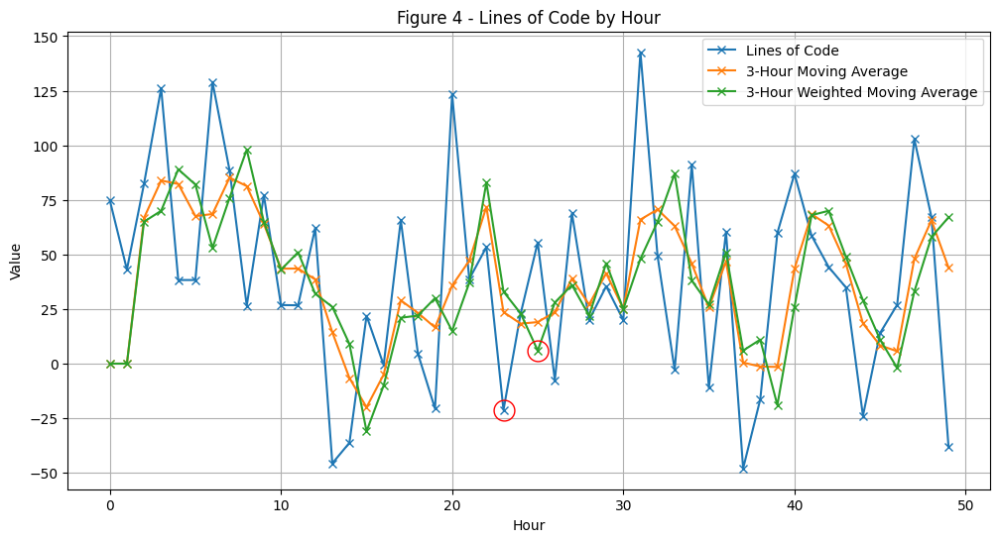

In [58]:
#| code-fold: true

hours = np.arange(len(lines_of_code))
plt.figure(figsize=(12, 6))
plt.plot(hours, lines_of_code, marker='x', label='Lines of Code')
plt.plot(hours, avg_lines_code_past_3_hours, marker='x', label='3-Hour Moving Average')
plt.plot(hours, weighted_avg_lines_code_past_3_hours, marker='x', label='3-Hour Weighted Moving Average')

def highlight_point(hours, data, point_idx, marker='o', size=15, color='red'):
   """
   Highlight a specific point on the plot with a marker.
   
   Args:
       hours: x-axis data (time points)
       data: y-axis data (values to plot)
       point_idx: index of point to highlight
       marker: marker style (default: 'o' for circle)
       size: size of marker (default: 15)
       color: color of marker (default: 'red')
   """
   plt.plot(hours[point_idx], 
           data[point_idx],
           marker,
           markersize=size,
           fillstyle='none',
           color=color)

# Usage example:
highlight_point(hours, weighted_avg_lines_code_past_3_hours, 25, color='red', size=15)
highlight_point(hours, lines_of_code, 23, color='red', size=15)

plt.title('Figure 4 - Lines of Code by Hour')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.grid(True)
plt.legend()  # Add the legend
plt.show()

Looking at Figure 4, we can see that the Weighted Moving Average (WMA) is smoothing our data, but does so differently than the regular MA (orange line). Our custom kernel gives greater weight to the first element in each window, which changes how peaks and valleys are represented. To understand the effect of the WMA, focus on the highlighted points at positions n=25 and n-2=23. For the window at position 25, the input values are [-21.24, 22.78, 55.55]. Since our kernel weights the first value (n-2) most heavily, and this value (-21.24) is significantly negative and far from the window's average, it pulls the WMA result downward. This is why the WMA point at position 25 is lower than the corresponding MA point, which would treat all three values equally.

What is the point of this? As discussed earlier, we wanted to apply a greater weighting to lines of code which have passed the review process. In other words, certain data points are more important than others across the window. Below, you'll see some other WMA kernels in action alongside the ones we've already examined.

Note, that the smoothing we see here is similar to the MA. The WMA does have a cutoff frequency, but calculating it is a little more involved and we will skip it for now.

And that concludes the Weighted Moving Average!

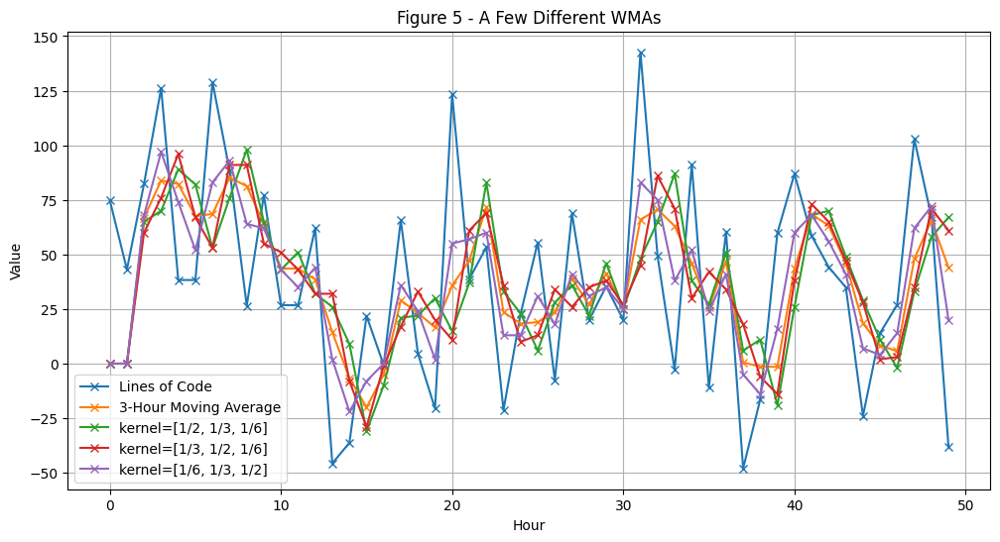

In [59]:
#| code-fold: true

weighted_avg1 = []
weighted_avg2 = []
weighted_avg3 = []

for i in range(len(lines_of_code)):
    weighted_avg1.append(weighted_avg_loc(i, kernel=[1/2, 1/3, 1/6]))
    weighted_avg2.append(weighted_avg_loc(i, kernel=[1/3, 1/2, 1/6]))
    weighted_avg3.append(weighted_avg_loc(i, kernel=[1/6, 1/3, 1/2]))

hours = np.arange(len(lines_of_code))
plt.figure(figsize=(12, 6))
plt.plot(hours, lines_of_code, marker='x', label='Lines of Code')
plt.plot(hours, avg_lines_code_past_3_hours, marker='x', label='3-Hour Moving Average')
plt.plot(hours, weighted_avg1, marker='x', label='kernel=[1/2, 1/3, 1/6]')
plt.plot(hours, weighted_avg2, marker='x', label='kernel=[1/3, 1/2, 1/6]')
plt.plot(hours, weighted_avg3, marker='x', label='kernel=[1/6, 1/3, 1/2]')

plt.title('Figure 5 - A Few Different WMAs')
plt.xlabel('Hour')
plt.ylabel('Value')
plt.grid(True)
plt.legend()  # Add the legend
plt.show()

I leave you with some other kernel examples, ponder how they smooth the data before moving on :)

---

## 2D Filters

So far the kernels/filters we have used operated on 1d data. It's time to move up a dimension and work with 2d data. The data type shifts from time series to images, a very natural representation of 2d data. As such, we move from signal processing to image processing.

The following grayscale image, or Jim the Cat, is our subject for this section:

![Figure 6 - Jim the Cat](https://www.cs.montana.edu/courses/spring2004/430/lectures/02/cat256.jpg){fig-align="center" style="text-align: center;"}

Kernels are useful for many things in image processing (<a href="https://homepages.inf.ed.ac.uk/rbf/HIPR2/filtops.htm">https://homepages.inf.ed.ac.uk/rbf/HIPR2/filtops.htm</a>). We'll start with the MA, and apply it to an image. Instead of a kernel which averages over previous data, our kernel will be a 2d grid that averages pixel intensities in a local area. This kernel is called a <b>Box Blur</b>, as with the MA the purpose is to reduce noise. When applied to images the kernel creates a blurring effect by smoothing out sharp transitions between pixels in images, which gives the kernel its name! 

### Box Blur

The math here is the same as in the 1d MA so we can push ahead without going through it again, the code will be our bridge.

The image in Fig 6 is a 2d grid of numbers, the information within it can be presented in a 2d matrix:

In [60]:
#| code-fold: true
from PIL import Image
import requests
from io import BytesIO
from IPython.display import display

# Read image from URL - saves us from downloading it :
url = "https://www.cs.montana.edu/courses/spring2004/430/lectures/02/cat256.jpg"
# We add a header so that our reqeust looks a little real and does not return an error 403.
headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}
response = requests.get(url, headers=headers)
img = Image.open(BytesIO(response.content))

# Convert to numpy array 
# We select one of the three channels, the image is stored in RGB even though it is greyscale
# This is probably just to maintain a standard. All three channels are equal and you can select any of
# channel 0, 1 or 2 and get the same resulting array.
img_array = np.array(img)

# Print shape and data
print("Image shape:", img_array.shape)
print("Image data:")
print(img_array)

Image shape: (256, 256)
Image data:
[[176 177 174 ... 131 129 126]
 [177 178 176 ... 131 129 126]
 [177 179 178 ... 131 127 124]
 ...
 [150 160 163 ...  91  91  93]
 [170 171 174 ...  97  96  95]
 [195 189 187 ... 102  99  97]]


So, our data is in a 2d matrix (or a list of lists in Python) and the kernel is 2d too! The operation is again a multiplication followed by a sum (dot product). In 2d we also do element wise multiplication and then a summation over all the points. But, it doesn't strictly constitute a dot product anymore as the dot product is defined as an operation between two vectors. However, the implementation is similar and we can still think of it as the dot product.

We again use n=3 for our kernel. The average will then be across a 3x3 area and the filter is as follows:

$$
\text{kernel} = \begin{bmatrix}
\frac{1}{9} & \frac{1}{9} & \frac{1}{9}\\
\frac{1}{9} & \frac{1}{9} & \frac{1}{9}\\
\frac{1}{9} & \frac{1}{9} & \frac{1}{9}
\end{bmatrix}
$$

Generally a kernel of size N would be an NxN matrix of the form:

$$
\text{kernel} = \begin{bmatrix}
\frac{1}{N^2} & \frac{1}{N^2} & \frac{1}{N^2}\\
\frac{1}{N^2} & ... & ... \\
\frac{1}{N^2} & ... &  \frac{1}{N^2}
\end{bmatrix}
$$

Our sliding window will operate on the data surrounding each pixel, we centre the kernel around the pixel. However, at the edges of images we can't do this because we don't have the values around the centre (Similar to MA where the first n-1 values were 0/undefined). The easiest solution is to not calculate for those points and set them to 0. In an image this leads to a reduction in the dimensions of the image[<sup>1</sup>](#1). 

The sliding window operation works as before, except we slide across the vertical axis too. Here's a small example with some 5x5 to which we will apply our 3x3 ($\frac{1}{9})$ kernel:

Sample data: 
$$
\begin{bmatrix}
2 & 5 & 1 & 4 & 3 \\
6 & 3 & 8 & 2 & 7 \\
1 & 4 & 2 & 5 & 1 \\
3 & 7 & 9 & 2 & 4 \\
2 & 1 & 5 & 6 & 8
\end{bmatrix}
$$

The kernel starts at position [1,1] highlighted in red, because that is the first position where with centered data our 3x3 kernel fits. Observe how the shift takes place. 

$$
\left[
\begin{matrix}
\colorbox{cyan}{2} & \colorbox{cyan}{5} & \colorbox{cyan}{1} & 4 & 3 \\
\colorbox{cyan}{6} & \colorbox{red}{3} & \colorbox{cyan}{8} & 2 & 7 \\
\colorbox{cyan}{1} & \colorbox{cyan}{4} & \colorbox{cyan}{2} & 5 & 1 \\
3 & 7 & 9 & 2 & 4 \\
2 & 1 & 5 & 6 & 8
\end{matrix}
\right]
\quad
\left[
\begin{matrix}
2 & \colorbox{cyan}{5} & \colorbox{cyan}{1} & \colorbox{cyan}{4} & 3 \\
6 & \colorbox{cyan}{3} & \colorbox{red}{8} & \colorbox{cyan}{2} & 7 \\
1 & \colorbox{cyan}{4} & \colorbox{cyan}{2} & \colorbox{cyan}{5} & 1 \\
3 & 7 & 9 & 2 & 4 \\
2 & 1 & 5 & 6 & 8
\end{matrix}
\right]
\quad
\left[
\begin{matrix}
2 & 5 & \colorbox{cyan}{1} & \colorbox{cyan}{4} & \colorbox{cyan}{3} \\
6 & 3 & \colorbox{cyan}{8} & \colorbox{red}{2} & \colorbox{cyan}{7} \\
1 & 4 & \colorbox{cyan}{2} & \colorbox{cyan}{5} & \colorbox{cyan}{1} \\
3 & 7 & 9 & 2 & 4 \\
2 & 1 & 5 & 6 & 8
\end{matrix}
\right]
\quad
\left[
\begin{matrix}
6 & 3 & 8 & 2 & 7 \\
\colorbox{cyan}{1} & \colorbox{cyan}{4} & \colorbox{cyan}{2} & 5 & 1 \\
\colorbox{cyan}{3} & \colorbox{red}{7} & \colorbox{cyan}{9} & 2 & 4 \\
\colorbox{cyan}{2} & \colorbox{cyan}{1} & \colorbox{cyan}{5} & 6 & 8 \\
2 & 1 & 5 & 6 & 8
\end{matrix}
\right]
$$

First window computation (center at [1,1]):
$$
\frac{1}{9}(2 + 5 + 1 + 6 + 3 + 8 + 1 + 4 + 2) =  3.56
$$

Second window computation (center at [1,2]):
$$
\frac{1}{9}(5 + 1 + 4 + 3 + 8 + 2 + 4 + 2 + 5) =  3.78
$$

Third window computation (center at [1,3]):
$$
\frac{1}{9}(1 + 4 + 3 + 8 + 2 + 7 + 2 + 5 + 1) =  3.67
$$

Fourth window computation (center at [2,1]):
$$
\frac{1}{9}(1 + 4 + 2 + 3 + 7 + 9 + 2 + 1 + 5) =  3.78
$$

Notice, in the summation and multiplication part we have flattened the data to be a dot product. In the implementation to follow we won't do this, it just helps our understanding. Also, we can simply multiply all datapoints in each operation by 1/9 as our kernel is uniform.

In general for an NxN kernel we can say that: $\text{start}=\frac{(N-1)}{2}$. 

For N=3, then $\text{start}=\frac{(3-1)}{2} = 1$, N=5, then $\text{start}=\frac{(5-1)}{2} = 2$ etc[<sup>2</sup>](#2). The sliding operation remains the same regardless of N size.


#### The Math Behind the Box Blur

Let's generalise what we see above with a formula :)

$$
y[i,j] = \sum_{m=-\lfloor N/2 \rfloor}^{\lfloor N/2 \rfloor}\sum_{n=-\lfloor N/2 \rfloor}^{\lfloor N/2 \rfloor} x[i+m,j+n]k[m+\lfloor N/2 \rfloor,n+\lfloor N/2 \rfloor]
$$

Where $\lfloor \rfloor$ is the floor operator, same as the // in Python. We remove the remainder of any division and round down. The indexing of $k$ works to reverse the range of the summation, $[-\lfloor \frac{N}{2} \rfloor, \lfloor \frac{N}{2} \rfloor]$, which in our case would be from [-1, 1]. Say we are at -1, we have $m = -1$ and then $-1 + 1 = 0$, similarly at $m = 0$ we get $0 + 1$ giving us the needed indices to correctly index our kernel. 

#### Implementing the Box Blur

In [24]:
# We can generate the range of values which m and n will take. This saves us some time later.
from itertools import product

def calc_kernel_range(N):
    return N // 2

N = 3
index = calc_kernel_range(N)
ranges = list(range(-index, index+1))
# product creates all combinations of two iterable datatypes
ranges = list(product(ranges, ranges))
ranges

[(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 0), (0, 1), (1, -1), (1, 0), (1, 1)]

In [25]:
# We implement the general formula using three for loops.
def box_blur(data, kernel):
    result = []
    N = len(kernel[0])
    edge_limit = (N-1) / 2
    
    for i in range(len(data)):
        # Must ensure we are in valid range such that our kernel fits
        if i < edge_limit or i >= len(data) - edge_limit:
            continue
        row = []
        for j in range(len(data[i])):
            # temp_sum holds the 
            temp_sum = 0
            # Must ensure we are in valid range such that our kernel fits
            if j < edge_limit or j >= len(data[i]) - edge_limit:
                continue
            for m, n in ranges:
                idx_i = i + m
                idx_j = j + n
                temp_sum += data[idx_i, idx_j] * kernel[m+(N//2), n+(N//2)]
            row.append(temp_sum)
        result.append(row)

    return np.array(result)
                

Let's run a sample matrix through our function. To make sure it works I suggest you try and calculate the box blurred matrix by hand. The numbers highlighted in green are the ones which will form the centre of our kernels. Slide across each one calculate the output and then check if the matrix you create matches the one we see here.

In [26]:
#| code-fold: true
np.random.seed(42) 
data = np.random.randint(0, 10, (5,5))
kernel = np.full((3, 3), 1/9)

$$
\left[
\begin{matrix}
6 & 3 & 7 & 4 & 6 \\
9 & \colorbox{green}{2} & \colorbox{green}{6} & \colorbox{green}{7} & 4 \\
3 & \colorbox{green}{7} & \colorbox{green}{7} & \colorbox{green}{2} & 5 \\
4 & \colorbox{green}{1} & \colorbox{green}{7} & \colorbox{green}{5} & 1 \\
4 & 0 & 9 & 5 & 8
\end{matrix}
\right]
$$

In [27]:
box_blur(data, kernel)

array([[5.55555556, 5.        , 5.33333333],
       [5.11111111, 4.88888889, 4.88888889],
       [4.66666667, 4.77777778, 5.44444444]])

In the example above we see the dimensionality reduction. In a 3x3 kernel we need to start at position [1,1], we cannot (without special measures) start in row 0 or column 0 for any kernel operation. Likewise, on the other side we cannot start a kernel operation in row/column 4. Hence, we lose 2 dimensions from this matrix. Generally, the dimensionality reduction is due to the constraint of making the kernel fit. 

Now, let's go back to our grayscale image and see what effect the box blur has.

In [28]:
img_blurred = box_blur(img_array, kernel)
img_array.shape, img_blurred.shape

((256, 256), (254, 254))

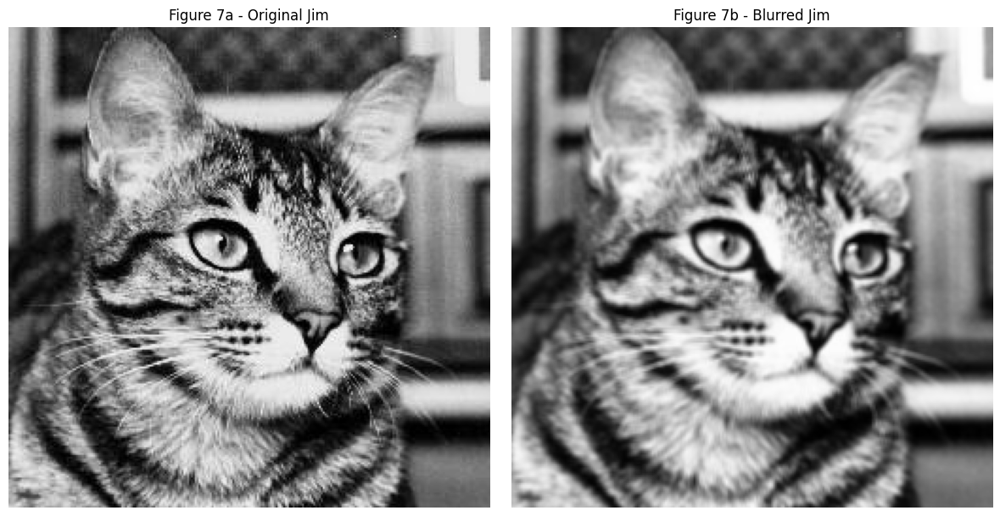

In [65]:
#| code-fold: true

# Create a figure with two subplots side by side
plt.figure(figsize=(12, 6))  # Optional: adjust figure size

# Original image (left)
plt.subplot(1, 2, 1)
plt.imshow(img_array, cmap='gray')
plt.axis('off')
plt.title('Figure 7a - Original Jim')

# Blurred image (right)
plt.subplot(1, 2, 2)  # (rows, columns, position)
plt.imshow(img_blurred, cmap='gray')
plt.axis('off')
plt.title('Figure 7b - Blurred Jim')

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the figure
plt.show()

The image has been blurred and does appear to be smoother. A good example is the checkerboard above the cat. Once again this operation acts in the same way as the MA we studied before. In the cat image, by using the box blur we average across a 3x3 area, reducing the effect of any one pixel and as before reducing the strength of the highest and lowest intensity pixels (analogous to the signal strength).

Let's move on to take a look at a specially designed kernel which unlocks more ideas on the road to the convolutional neural network.

### Edge Detection Kernels

Until this point the kernels used have been very basic, they were just averaging kernels (the WMA was a slight departure) and their purpose has been the same. Edge detection is a task in image processing where we try and highlight the edges of objects in an image. This discussion will form the foundation for understanding what a CNN does.

#### The Prewitt Operator


The <b>Prewitt Operator</b> is a specialised kernel to detect edges. It contains two kernels, one to detect horizontal edges and another to detect vertical edges.

$$
\text{horizontal} = \left[
\begin{matrix}
-1 & -1 & -1 \\
0 & 0 & 0 \\
1 & 1 & 1 \\
\end{matrix}
\right]
$$

$$
\text{vertical} = \left[
\begin{matrix}
-1 & 0 & 1 \\
-1 & 0 & 1 \\
-1 & 0 & 1 \\
\end{matrix}
\right]
$$

An edge in an image is characterized by an abrupt change in pixel intensity, which directly informs the design of Prewitt kernels. These kernels are specifically crafted to detect intensity changes in different directions. Consider the horizontal operator: it contains -1 values in the top row, 0s in the middle row, and 1s in the bottom row. This pattern effectively negates the top row of pixels, ignores the middle row, and preserves the bottom row before summing. The intuition is straightforward - where an edge exists, pixels on opposite sides will have significantly different intensities. The greater this intensity difference, the larger the absolute value produced by the kernel. When the output approaches zero, it indicates similar pixel intensities on both sides, suggesting no edge is present. Let's look at an example:

$$
\text{window} = \left[
\begin{matrix}
200 & 255 & 193 & 201 \\
150 & 172 & 169 & 132\\
70 & 80 & 83 & 54\\
\end{matrix}
\right]
$$

If we use the horizontal filter on $\text{window}$ we get:

$$
\text{horizontal\_edges} = \left[
\begin{matrix}
-415 & -432
\end{matrix}
\right]
$$

And these are quite large (absolute) numbers (given pixel intensity only goes up to 255) so the filter tells us an edge exists here. The numbers exceeding 255 are a result of not normalising our data, but we don't need to here. In an actual output image, these would be scaled to fit in the range 0-255 and you'd see them as bright white. Let's look at another example where an edge would not be present:

$$
\text{window} = \left[
\begin{matrix}
195 & 182 & 193 & 179 \\
150 & 172 & 169 & 132\\
176 & 201 & 195 & 187\\
\end{matrix}
\right]
$$

$$
\text{horizontal\_edges} = \left[
\begin{matrix}
2 & 29
\end{matrix}
\right]
$$

This time the filter outputs are close to 0 indicating a lack of edges. 

In general, how will the edges show in our output? If the filter detects an edge it will output large numbers, these translate to high pixel intensities (negative values will be flipped) and vice versa for when the filter outputs numbers close to 0. A high pixel value represents a white colour and a low will be black, the differences we see will highlight the edges. Knowing this, we can apply the Prewitt Operator to our cat image.

In [67]:
horizontal_edge_kernel = np.array([
    [-1, -1, -1],
    [0, 0, 0],
    [1, 1, 1]
])

vertical_edge_kernel = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]
])

horizontal_edges = box_blur(img_array, horizontal_edge_kernel)
vertical_edges = box_blur(img_array, vertical_edge_kernel)

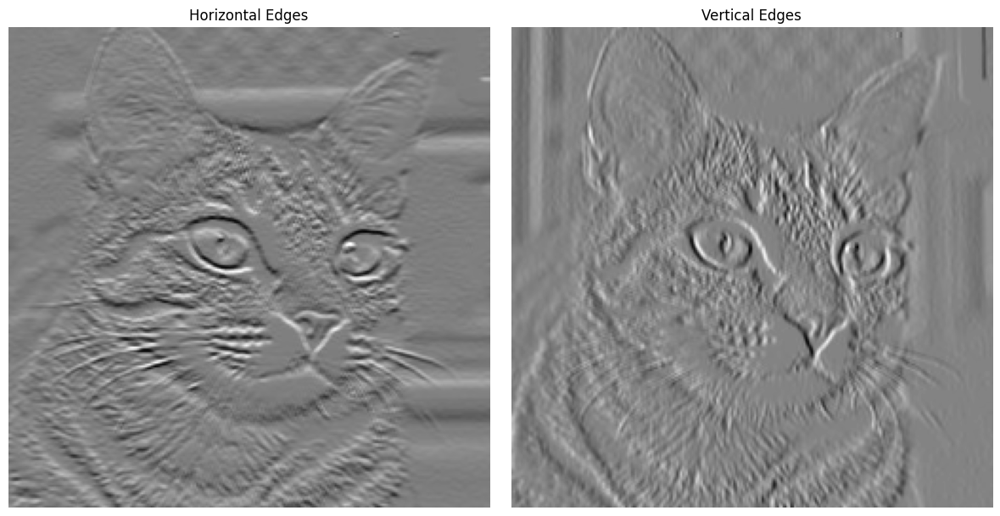

In [68]:
#| code-fold: true

# Create a figure with two subplots side by side
plt.figure(figsize=(12, 6))  # Optional: adjust figure size

# Original image (left)
plt.subplot(1, 2, 1)
plt.imshow(horizontal_edges, cmap='gray')
plt.axis('off')
plt.title('Horizontal Edges')  # Optional: add title

# Blurred image (right)
plt.subplot(1, 2, 2)  # (rows, columns, position)
plt.imshow(vertical_edges, cmap='gray')
plt.axis('off')
plt.title('Vertical Edges')  # Optional: add title

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the figure
plt.show()

The eyes are the best example here, in the horizontal edge image we see the clear difference in pixel values. If you look back at Fig 6, the part around the eyes is black, creating a large abrupt change in pixel density at the border which our filter picks up on.

In this edge detection case we see the true power of what kernels can do, we are not just doing a simple operation like averaging anymore rather we are detecting underlying patterns in our data! The Prewitt kernel has been specifically designed to capture patterns in the data whereby pixel intensity differs, the greater the difference the greater the output of the filtering operation. 

The approach we have been using to apply our kernels is <b>cross-correlation</b>. Cross-correlation is a pattern matching operation between two pieces of data whereby the greater the similarity between the kernel and data the greater the value of the output, as we saw with the Prewitt operator. This is also where the idea for the sliding dot product is from. It's time to embark on a deep dive of cross-correlation and its closely related operation <b>convolution</b>.

--- 

## Cross-correlation and Convolution

So far, we've seen how the sliding window dot product can help us to process data whether it be time series or images. The operations we have been using apply the cross-correlation technique. Cross-correlation has a closely related operation named convolution, which gives the CNN its name. Convolution uses the same sliding window dot product method, but differs in that either the kernel or the data is flipped. This flipping has some interesting effects, especially when dealing with time dependent data. To better understand the implications, let's turn to our friend John.

### Cross-Correlation and Convolution - An Intuitive Approach

John's company have implemented another new review process where instead of reviews taking 2 hours there is a multi-step 3 day process. On day 1 there is 1 reviewer, on day 2 there are 3 reviewers and 5 reviewers on day 3. The reviewers are very thorough and whatever changes we give them, they will review in one day ready for review by the next set of reviewers the next day. Our goal is to track the total number of changes reviewed at the end of any one day. Let's get some dummy data to explore this problem:

Lines of Code: \[5, 10, 9, 21, 5, 7\]
Reviewers: \[1, 3, 5\]

So, the task is to keep track of how many lines of code all reviewers have read. Here's a simple way to do it (we will use the $y[x]$ to keep it clean and pad the lines of code with zeros such that we can calculate $y[0]$ and $y[1]$):

    - Day 0 - y[0] = 5*1 = 5
    - Day 1 - y[1] = 5*3 + 10*1 = 25
    - Day 2 - y[2] = 5*5 + 10*3 + 9*1 = 64
    - And so on and so forth...

This manual method is tedious. A thought arises, we have two lists so let's try to apply cross-correlation on this task! 

    - y[0] = 1*0 + 3*0 + 5*5 = 25
    - y[1] = 1*0 + 3*5 + 5*10 = 65
    - y[2] = 1*5 + 3*10 + 5*9 = 75
    - ...

Woah, something seems off here. Take a closer look at the order of operation in the cross correlation approach. Take y[0], on day 0 we have only 1 reviewer but here we act as if we have 5. Cross-correlation is applying our kernel backwards! 

Let's flip it then, by doing so we move into a convolution operation. By flipping the kernel becomes: \[5, 3, 1\]. 

    - y[0] = 5*0 + 3*0 + 1*5 = 5
    - y[1] = 5*0 + 3*5 + 1*10 = 25
    - y[2] = 5*5 + 3*10 + 1*9 = 64

Convolution matches our manual calculation! The key here was flipping the kernel, when flipped and convolved the indices line up with the correct time order. The most recent lines of code passed to reviewers will always be reviewed by one reviewer as intended by the company, this is reflected in our kernel too!

### The Maths of Convolution and Cross-correlation

The final piece of the puzzle is a coverage of the general mathematics behind both convolution and cross-correlation. 

Take our convolution example, we have two lists of data, we flipped one of them and then multiply and sum. We can write this generally as:

$$
y[n] = \sum_{i=0}^{M-1}x[i]k[n-i]
$$

$y[n]$ is any output and $M=\text{len(k)}$ where $k$ is the kernel. Likewise, cross-correlation can be seen as:

$$
y[n] = \sum_{i=0}^{M-1}x[i]k[n+i]
$$

Now you see how simple the difference is, it almost makes you wonder why the different operations? Firstly, they can result in wildly different outputs because convolution looks back in a time aware fashion but cross-correlation doesn't. Convolution is better suited in cases where causality is paramount, in signal processing the current value is gotten from previous ones and in time series the current value is usually somewhat dependent on past values, more importantly in both cases in a live system you have no idea what is coming next. Whereas, cross-correlation is more concerned with pattern matching as in the Prewitt case.

--- 

#### An Aside - Calculus
Both cross-correlation and convolution have a continuous formula, currently we have observed the discrete version which works with arrays that have a defined set of values. However, through calculus we can define convolution and cross-correlation for continuous data or functions. Given the data we have previously for the review system, take \[1, 3, 5\] to be the function k(x) where k(0)=1, k(1)=3 and k(2)=5 and likewise for the data list we make it f(x). So f(x) = data function and k(x) = kernel function.

By this, the definition of our current convolution becomes:

$$
y[n] = \sum_{i=0}^{M-1}x(i)k(n-i)
$$

and cross-correlation becomes:

$$
y[n] = \sum_{i=0}^{M-1}x(i)k(n+i)
$$

See if you can spot the difference, it's very subtle... The square brackets are now normal brackets! Because we are no longer indexing an array but passing parameters to a function which returns an output and for the values we defined happens to return exactly the values we need... hmmm very convenient (note that what the actual function is doesn't matter just that it returns the values we need at the specific range, this is sort of confusing but imagine it's just a perfect function whose form is of little importance). We can extend this idea, a summation is still discrete, the values can be made smaller but not infinitely small. Enter calculus, the integral can be used to sum continuous data! The integral adds up infinitesimally small parts over ranges, so we can sum over every possible point for where x(x) and k(x) are defined. So we get:

Convolution:

$$
\int^{\infty}_{-\infty} x(\tau)k(t-\tau) d\tau
$$

Cross-correlation:

$$
\int^{\infty}_{-\infty} x(\tau)k(t+\tau) d\tau
$$

Here are the major changes: the summation becomes an integral and we switch out i and n for $\tau$ and t respectively, moving us from the discrete to continuous space. For all intents and purposes, to us these are the same and in theory they work the same too. In most machine learning cases you will have discrete data so the the previous formulation will serve us well enough.

So, if any ever asks you to explain cross-correlation you can tell them: it's fancy multiplication where we take a kernel, slide it over our data, take the product and sum all points doing this many times over and over. Cross-correlation gives us a method to pattern match. If they ask for convolution you tell them: it's cross-correlation with the kernel flipped, the flipping adds a sense of causality to our operation.

---

## Convolutional Neural Networks (CNN)

So far, all kernels were hand selected or defined by the task. While this approach works for well-defined operations like edge detection or blurring, it falls short for complex challenges. Consider this: if you wanted to create a system to distinguish between cats and dogs, what kernel values would you choose? With potentially an infinite set of kernel values, it's impossible to choose the right one. This is where the neural network steps in, combines with filters and out steps the CNN!

The CNN represents one of deep learning's most powerful ideas: instead of hand-crafting kernels, let the network learn the optimal values for a given task. It consists of multiple layers, with the convolutional layer at its heart - where many learnable filters work together to identify different patterns in input images. While other types of layers[<sup>3</sup>](#3) support the network, the convolutional layer is the star of the show. 

Interestingly, despite the name, CNNs use cross-correlation rather than convolution when sliding filters over inputs (don't just take it from me, look at the <a href="https://github.com/pytorch/pytorch/blob/main/torch/nn/modules/conv.py#L495">PyTorch implementation</a>). More on this to come.

To avoid ambiguity, we'll refer to this operation simply as the 'conv' operation - it's the beautiful combination of cross-correlation's pattern-matching ability with the neural network's capacity to learn optimal parameters.

### Adapting Cross-correlation to the Neural Network Setting

So, previously all kernels were either defined by the task (MA) or hand designed specifically to achieve some goal (Prewitt Operator, blurring and WMA). This is counter to the neural network approach, where we let the algorithm decide the parameters (here parameters mean the values in our kernel) of our operations. Naturally you wonder, what if we can enable a neural network to learn the parameters of a kernel? This wonderful idea is what gives us the CNN, rather than selecting parameters by hand we let the model learn the best parameters to complete our task, best meaning that which minimises the loss the most. Honestly that's it, instead of defining kernels we let the model do it! From this arises the lack of an actual convolution operation in the CNN, the model doesn't care if we use cross-correlation or convolution! The model decides which orientation the kernel should be - if it is best to learn the flipped kernel in cross-correlation (the convolution kernel) then it does and if we were to use convolution it may end up learning the flipped kernel (so the cross-correlation kernel). By allowing the model to learn the kernel, we alleviate the decision of whether to use cross-correlation or convolution.

The implementation of conv in CNNs doesn't stray from what we've built before, we continue to use a sliding window dot product with a kernel and a summation or simple fancy multiplication. However there are two big changes, firstly we need to make the operation work with RGB data and second add the framework which lets our model learn the parameters. On the first change, an RGB image has 3 channels or 3 2d maps of information so our kernel needs to work across channels. The data seems to be 3d now, however it is not. Each pixel has 3 values (the channels store this info) at the same location, whereas in true 3d the 3 channels represent different spatial locations. To deal with this, we apply three separate kernels on each 2d map in any given image and then sum the outputs to give us one position (this differs from typical cross-correlation or convolution scenario, there with an RGB image we get RGB channels out too, as we don't sum the results across channels)

Now, this is remarkable but no accident. The conv operation (op) itself has many attractive properties, which make it viable to use in the CNN. The 3 key properties are: sparse interactions, parameter sharing and equivariance to translation. 

#### Sparse Interactions 
In traditional fully connected neural networks, images present a problem. Namely, any given image has a lot of data points. Take an image of size 128x128x3, to create a fully connected layer you would need 49152 weights. Then imagine many of these layers connected together, your parameter count would grow very quickly. In comes the kernel, each value in the output of our conv operation (we call the output a filter map) is dependent upon the parameters of our kernel. However, because the kernel is usually much smaller than the input data each output point is only affected by a small subset of input values, contrast this with the fully connected layer where each point in the filter map would be affected by each pixel in the input. By doing this we increase the efficiency of our network.

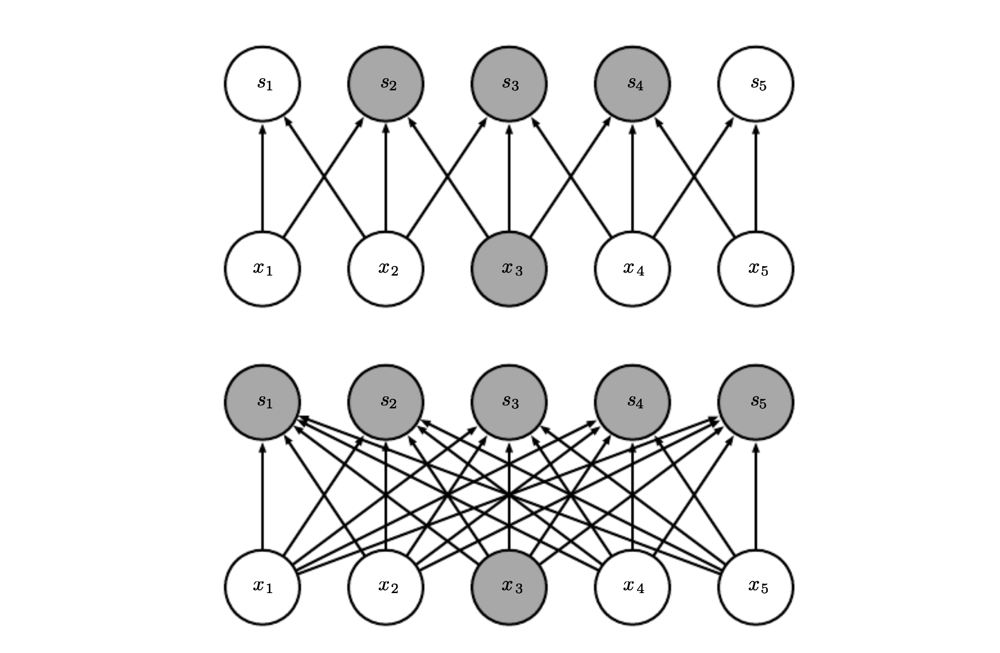

#### Parameter Sharing

Look back at any of the examples we studied, we set the parameters for the kernel and used them across the data without changing the values. This is a key idea in cross-correlation/convolution and subsequently in the conv operation. The assumption is that if we can detect a useful feature in one part of the data it will appear in other parts of the data. So, with the conv op, where we learn the parameters, instead of learning different parameters for each input pixel, we can just learn the $k \times k$ kernel and apply it across the image.

#### Equivariance to Translation

Translation means a shift of the data. Take images, a translation could be moving the image up, down, left or right. Being equivariant means that as input changes the output changes in the same way. Put both together, if our image is moved then our output won't change materially it'll just move too. This property, is the one which allows parameter sharing as our kernels can detect the same feature if they are just moved around the image. 

This property increases the generality of our models from train time to test time. Imagine in our training data we have cats, but they only appear in the left side of images. Then the model will create filters good at detecting cats, now during test time we have an image of a cat on the right side, what happens? Well, due to equivariance to translation the exact position doesn't matter, as our feature maps are robust to this!

Look at Figure 9, we go back to the edge detection Prewitt operator to showcase equivariance to translation. Taking Jim the cat, one image is normal and the other has been shifted by 128 pixels. The output of this shift is the image split and put back together down the middle. Now, look at the edge detection output, it's shifted in the same way! This behaviour applies in CNN kernels too.

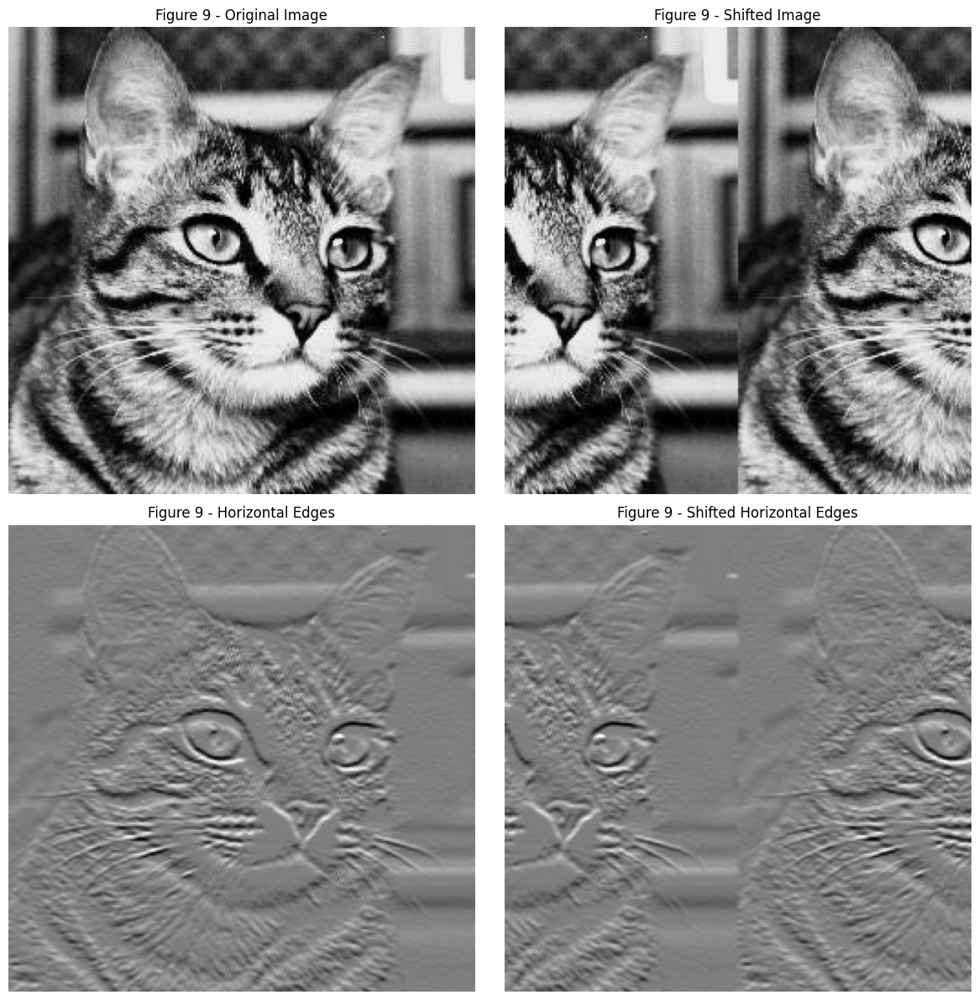

In [78]:
#| code-fold: true

horizontal_edges = box_blur(img_array, horizontal_edge_kernel)

shifted_array = np.roll(img_array, shift=128, axis=1)

shifted_horizontal_edges = box_blur(shifted_array, horizontal_edge_kernel)

# Create a figure with a 2x2 grid
plt.figure(figsize=(12, 12))

# Original image (top left)
plt.subplot(2, 2, 1)
plt.imshow(img_array, cmap='gray')
plt.axis('off')
plt.title('Figure 9 - Original Image')

# Shifted image (top right)
plt.subplot(2, 2, 2)
plt.imshow(shifted_array, cmap='gray')
plt.axis('off')
plt.title('Figure 9 - Shifted Image')

# Original edges (bottom left)
plt.subplot(2, 2, 3)
plt.imshow(horizontal_edges, cmap='gray')
plt.axis('off')
plt.title('Figure 9 - Horizontal Edges')

# Shifted edges (bottom right)
plt.subplot(2, 2, 4)
plt.imshow(shifted_horizontal_edges, cmap='gray')
plt.axis('off')
plt.title('Figure 9 - Shifted Horizontal Edges')

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the figure
plt.show()

### Implementing the Conv Operation

We have already implemented the conv operation, earlier we wrote the box_blur function which implements the behaviour required. The only bit we need now is the differentiable part (which allows us to learn parameters). However the box_blur function is very slow. We used 3 for loops giving an approximate runtime of $O(N^3)$, which is pretty abysmal if we were to add a batch dimension (processing more than one image at a time) we'd end up with $O(N^4)$. Let's see if we can speed this up.

There is a beautiful piece of equipment called a "GPU" which excels at doing fast matrix multiplications, luckily for us we don't have to make one nor do we have to implement the low-level code to use one, what is required of us is to transform our slow conv operation into something which can be executed with matrix multiplications. This is a common theme in deep learning, in the back of your mind think "How can we best use the parallel processing capability of a GPU to speed this up" (most of the time someone will have already done it for you!).

---

#### An Aside - GEneralised Matrix Multiplication (GEMM)

In the days of old (1979) a library was created, for the Fortran language, by the wizards we look back upon in awe. The library was called Basic Linear Algebra Subprograms (BLAS). The purpose was to speed up and have standard optimised implementations of common linear algebra operations such as vector addition, dot product, scalar multiplication, linear combinations and most importantly for us matrix multiplication[<sup>4</sup>](#4) The idea was to allow developers to focus on the higher level details of making useful applications with the operations, rather than spend huge amounts of time on low-level optimisations. It's a classic division of labour. Another benefit, is by having a central team which focuses on the low-level details they can make the most advanced optimisations due to their expertise and create operations which can be used regardless of the hardware they are used on. The second point is important, without such libraries we would all have to spend lots of time programming the same things, then if a new piece of hardware comes out there's no guarantee our code will be portable, not easily anyway.

GEneralised Matrix Multiplication (GEMM), arose from BLAS in 1990. It's an extremely optimised matrix multiplication which we want to utilise. As mentioned, the goal of these libraries is to be portable for any hardware, unfortunately BLAS was created for the CPU. CPUs are great, but their ability to process larger parallel processes is outmatched by the GPU. GPUs see a lot of use in the deep learning space, the use of the GPU is what kicked off the deep learning revolution in 2012[<sup>5</sup>](#5). GPUs are great at matrix multiplications (which is the most common operation in deep learning). Many people knew this and so did Nvidia,  in 2014 Nvidia created a library for their GPUs to speed up deep learning operations in a similar manner to BLAS but they targeted GPUs. It was aptly named: cuDNN (Cuda Deep Neural Network), a series of primitive operations used in deep learning which are optimised for GPUs (its creation was inspired by the goal of BLAS, cuDNN fulfilling the same role for Nvidia GPUs). Funnily enough, CNNs are what sparked the creation of cuDNN.

---

So, to get a faster conv we need to take our sliding window approach and get a matrix multiplication(mat mul). Think first about what our conv operation looks like at the moment: we have a kernel, which slides over the input image. Each $k{\times}k$ area which the kernel passes over is called a patch. We have many patches, and with these is where the conversion to a mat mul takes place. There's another method named im2col (from matlab), which turns the sliding window patches into columns of a matrix. We flip this slightly, to take our patches and flatten them into rows and the kernel itself becomes a column (I found this to be more intuitive for me, it doesn't matter much which way we flatten the patches to), let's call my operation <b>im2row</b>.

Im2row flattens our image into a matrix with each patch in a row and the kernel as a column vector. If we were to have multiple kernels we would stack the flattened column vectors such that we get a matrix where each column is one flattened kernel. Then a matmul will get us the same result that our old conv would get! Bear with me here, the code to follow will add the meat to the bone, I think this process is wonderful albeit not easy to understand at first.

#### A Small Example - Im2row and Matmuls

We'll go through a small example by hand to get our heads around the concept. Let's generate a some data, our input being a 5x5 "image" (just some random integers from 0-255) and a 3x3 kernel.

A last bit of theory before we start, I want to outline how im2row transforms our conv to matrices. We know that we flatten patches into rows, but what will be the dimension of our image_matrix? Well, the number of rows will be the number of patches and the length of the column will be the length of any one given flattened patch. Therefore, <b>m = number of patches and n = length of a flattened patch</b>. For the kernel then, <b>n=length of a flattened patch and p = number of kernels</b>. We see then post a matmul the output shape given by $(m \times n)(n \times p) = (m \times p)$, will be the number of patches for rows and number of kernels for columns. These outputs will form matrices, with each column vector being one output of the feature maps.

With that in mind, lets get going!

In [30]:
# Lets make an example image (5x5) and a kernel (3x3) - no channels to keep it simple
np.random.seed(42)
image_no_channels = np.random.randint(0,256, (5,5))
np.random.seed(42)
kernel = np.random.randint(0,10, (3,3))

In [31]:
image_no_channels, kernel

(array([[102, 179,  92,  14, 106],
        [ 71, 188,  20, 102, 121],
        [210, 214,  74, 202,  87],
        [116,  99, 103, 151, 130],
        [149,  52,   1,  87, 235]]),
 array([[6, 3, 7],
        [4, 6, 9],
        [2, 6, 7]]))

The patches for this data are $3{\times}3$, or $k \times k$ with k being the dimension of our kernel ($k=3$ here). We can manually define an image_matrix by taking each patch and flattening it out into a row. I encourage you to get a pen and paper (or use your notebook) and do this part yourself. Remember a patch is the area the kernel slides over.

I'll define the first two and leave the rest to you (note, we'll use 0-based indexing):

Row 0 of image matrix, starting at 188 (position 1,1 in image_no_channels matrix, where this is the centre of the kernel) the patch would be:

$$
\begin{gather*}
\text{Patch 0}\\
\begin{bmatrix}
102 & 179 & 92 \\
71 & 188 & 20 \\
210 & 214 & 74\\
\end{bmatrix}
\xrightarrow{\text{flatten}}
\begin{bmatrix}
102 & 179 & 92 & 71 & 188 & 20 & 210 & 214 & 74
\end{bmatrix}
\end{gather*}
$$

Row 1 of image matrix, starting at 20 (position 1,2 in image_no_channels matrix) the patch would be:

$$
\begin{gather*}
\text{Patch 1}\\
\begin{bmatrix}
179 & 92 & 14\\
188 & 20 & 102\\
214 & 74 & 202\\
\end{bmatrix}
\xrightarrow{\text{flatten}}
\begin{bmatrix}
179 & 92 & 14 & 188 & 20 & 102 & 214 & 74 & 202
\end{bmatrix}
\end{gather*}
$$

And so on for the image_matrix. On the other hand, the kernel is flattened into a column vector (stored in a matrix even though there is only one for generality):

$$
\begin{gather*}
\text{Kernel}\\
\begin{bmatrix}
6 & 3 & 7\\
4 & 6 & 9\\
2 & 6 & 7\\
\end{bmatrix}
\xrightarrow{\text{flatten}}
\begin{bmatrix}
6\\
3\\
7\\
4\\
6\\
9\\
2\\
6\\
7\\
\end{bmatrix}
\end{gather*}
$$

That's it, overall quite a simple process, but one with astonishing results. 

Expand the following code block to see the full image_matrix.

In [84]:
#| code-fold: true

image_matrix = np.array([
    [102, 179, 92, 71, 188, 20, 210, 214, 74],
    [179, 92, 14, 188, 20, 102, 214, 74, 202],
    [92, 14, 106, 20, 102, 121, 74, 202, 87],
    [71,188, 20, 210, 214, 74, 116, 99, 103],
    [188, 20, 102, 214, 74, 202, 99, 103, 151],
    [20, 102, 121, 74, 202, 87, 102, 151, 130],
    [210, 214, 74, 116, 99, 103, 149, 52, 1],
    [214, 74, 202, 99, 103, 151, 52, 1, 87],
    [74, 202, 87, 103, 151, 130, 1, 87, 235],
])
kernel_matrix = np.array([
    [6],
    [3],
    [7],
    [4],
    [6],
    [9],
    [2],
    [6],
    [7],
])
image_matrix.shape, kernel_matrix.shape

((9, 9), (9, 1))

The current shapes match the theory we discussed above, in a 5x5 image a 3x3 kernel fits 9 times and a 3x3 patch flattened into a row is 9 numbers. Also, we have 1 feature map which is 3x3, thus the 1x9 column vector.

##### Matrix Multiplication - A Recap

Now it's time for the fun stuff, matmuls. Let's refresh our memory of how matmuls work. This will tell us why the im2row works and why we can perform such an optimisation. The <a href="https://en.wikipedia.org/wiki/Matrix_multiplication">equation</a> for matmul is:

$$
c_{ij} = a_{i1}b_{1j} + a_{i2}b_{2j} + ... + a_{in}b_{nj} = \sum_{k=0}^{n}a_{ik}b_{kj}
$$

For us, $\mathit{\mathbf{C}}$ would be the output feature map/s, $\mathit{\mathbf{A}}$ is the input image and $\mathit{\mathbf{B}}$ the kernel. The matmul looks familiar to the dot product, because it is a dot product. Namely $c_{ij}$ is the dot product between $i^{th}$ row of a and $j^{th}$ column of b. Think about how we orientated the image_matrix and kernel_matrix, with our patches as the rows of $\mathit{\mathbf{A}}$ and kernel as the column of $\mathit{\mathbf{B}}$ we are doing the exact dot product we need, we have reduced our conv to a much more efficient matmul!

Using the formula above we can take our matrices to get the following (a useful way to picture this is we take the column of the kernel matrix and compute the dot product between each row, for multiple columns you'd just do this one column at a time):


<div style="overflow-x: auto;">

$$
\begin{align*}
c_{1,1} &= (102 \cdot 6) + (179 \cdot 3) + (92 \cdot 7) + (71 \cdot 4) + (188 \cdot 6) + (20 \cdot 9) + (210 \cdot 2) + (214 \cdot 6) + (74 \cdot 7) = 5607\\
c_{2,1} &= (179 \cdot 6) + (92 \cdot  3) + (14 \cdot 7) + (188 \cdot 4) + (20 \cdot 6) + (102 \cdot 9) + (214 \cdot 2) + (74 \cdot 6) + (202 \cdot 7) = 5524\\
c_{3,1} &= (92 \cdot 6) + (14 \cdot  3) + (106 \cdot 7) + (20 \cdot 4) + (102 \cdot 6) + (121 \cdot 9) + (74 \cdot 2) + (202 \cdot 6) + (87 \cdot 7) = 5086\\
\vdots \\
c_{9,1} &= (74 \cdot 6) + (202 \cdot 3) + (87 \cdot 7) + (103 \cdot 4) + (151 \cdot 6) + (130 \cdot 9) + (1 \cdot 2) + (87 \cdot 6) + (235 \cdot 7) = 6316
\end{align*}
$$
    
</div>

I'll let you fill in the blanks. For $c_{4,1} \xrightarrow{\;} c_{8,1}$. Remember, here we do exactly the same dot products we would have done with the kernel and its related patches.

After all is said and done we get the following matrix.

$$
\begin{bmatrix}
5607 \\
5542 \\
5086 \\
5467 \\
6893 \\
5586 \\
5022 \\
6012 \\
6316
\end{bmatrix}
$$

The last step of this process is to reshape the feature map:

$$
\begin{bmatrix}
5607 & 5542 & 5086 \\
5467 & 6893 & 5586 \\
5022 & 6012 & 6316
\end{bmatrix}
$$

In [87]:
# Here's the numpy matmul, just to check we did it right.
np.matmul(image_matrix, kernel_matrix)

array([[5607],
       [5524],
       [5086],
       [5467],
       [6893],
       [5584],
       [5022],
       [6012],
       [6316]])

There we have it! The im2row algorithm in action, it's truly wonderful! By transforming our input data and kernel just a little bit we get huge time savings. All that's left to do is implement this in an algorithm which we can be used in a neural network forward pass.

### The General Case - Extension to RGB (3 channel) Images

Typically in a CNN we work with 3 channel (RGB) images, not 1 channel (grayscale). In a 3 channel image instead of having one value at each point, we have 3. This is represented by a 3 layer matrix of ${H}\times{W}$ of the image, so we now have $H \times W \times D, \text{ where } D=3$. As mentioned, we can treat this in the same manner we handled the conv, because it isn't true 3d. The depth of 3 represents RGB, each one R,G,B is called a channel. Essentially at each point in the image we have 3 pixel values and in the entire image we have 3 2d matrices. Our kernel will have the same depth as the input_data. There are two equivalent ways to apply the sliding window, one: apply the kernel individually to each 2d matrix and then sum the outputs, two: sum all 2d matrices across the depth and then apply one kernel. The idea is that regardless of the depth, the conv produces one value at each position. 

For im2row, the only major change is how we flatten the input data. We flatten each 2d matrix and then append them to each other. So for an RGB image, we'd flatten R, G, B 2d matrices as before by taking our $k \times k$ and then we append first the G to the end of R and then B to the end of R and G. Look at Figure 10 to see this in action. Likewise for the kernel, which is now $k \times k \times D$, flatten each $k \times k$ matrix and then append the vectors together. Then, the rest is the same as we do the matmul, providing us $n$ number of columns of output, which we can reshape into our feature maps. Note, we do not reshape them into having a depth $D$, because the kernel operation produces one value at every point each output filter map has shape $H \times W$ without the $D$. The depth of the output is decided by the number of kernels we apply.

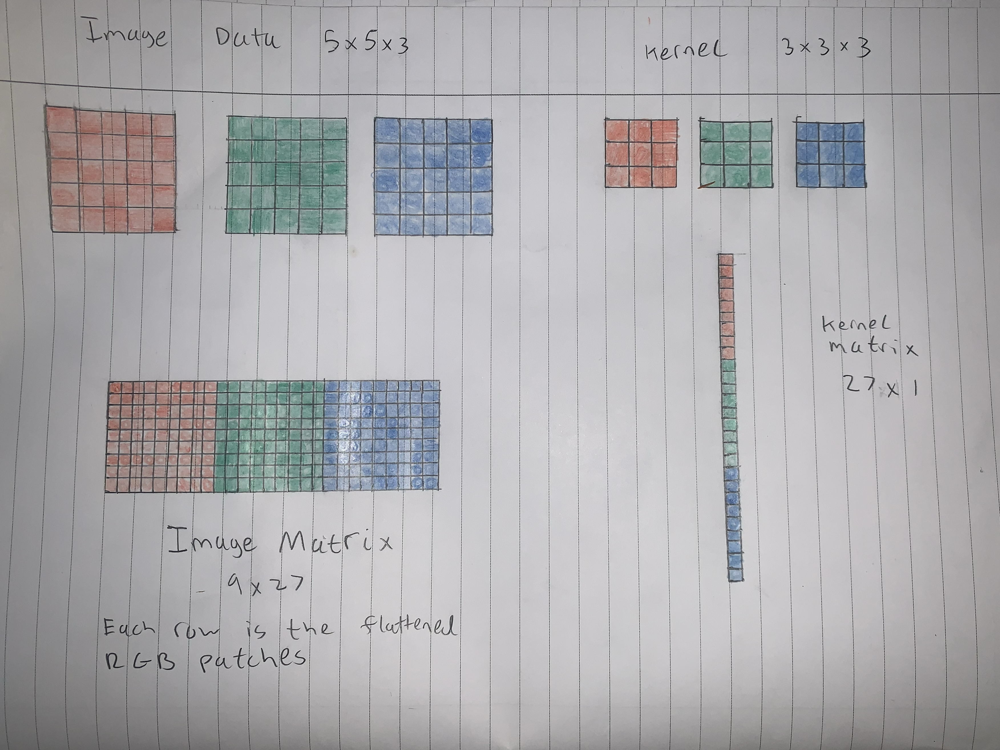

Picking up our old example, now with a $5 \times 5 \times 3$ input image and a $3 \times 3 \times 3$ kernel. Recall we want the shapes $m \times n$ and $n \times p$. 

Where:
    
$$m=\text{number of patches which fit in the input image}$$
    
$$n=\text{length of a flattened patch}$$
    
$$p=\text{the number of kernels we want to apply}$$

The number of patches doesn't change, in a $5 \times 5 \times 3$ image we can apply a $3 \times 3 \times 3$ kernel, 9 times. To calculate $m$ I prefer to look at the $H \times W$ not the $D$ value, the $D$ doesn't play too big of a part here. So:
$$
m=9, n=27, p=1
$$
The size of the input matrix will be $9 \times 27$ and the kernel matrix will be $27 \times 1$. The only difference here is $n$, we calculate this by flattening the $H \times W$ and then multiplying by $D$. Essentially, we flatten each $H \times W$ in all channels, ending up with $D$ of them. Then post matmul we just need to reshape, before reshaping we'd have a $9 \times 1$ matrix. After reshaping we get our $3 \times 3 \times 1$ feature map output.

Up to now, we've worked with 1 kernel at a time in return giving only 1 output feature map. This isn't common in CNNs, in CNNs we usually map to a larger number of feature maps, say 16. To do this, we would just create 16 individual kernels and apply them. Doing so with the above example would give the following:
$$
m=9, n=27, p=16
$$
The output on im2row has the shape $9 \times 16$, $16$ columns which each represent 1 feature map. When we reshape, we reshape each column into a $3 \times 3$ matrix, finally we'd have a 16 channel matrix $3 \times 3 \times 16$ ready for the next layer!

### Implenting Im2row
All that remains is to implement im2row! This function will work for any general 2d image with any number of channels.

There are 3 pieces of the im2row puzzle:

    1 - Flattening the input patches
    2 - Doing the matmul
    3 - Reshaping matmul output

Let's get to it, right after a small aside.

---

##### An Aside - How 3 Channel Images are Represented in Data

Below you see the structure of a 3 channel image and a 3 channel kernel in numpy, it'll be the same in PyTorch. Each matrix represents one channel, the first 5x5 is red, the second is green and the last is blue. It's essentially 3 stacked matrices one representing each channel.

In [34]:
#| code-fold: true

np.random.seed(42)
# We do not add a batch dimension here. 
img_test = np.random.randint(0, 10, (3, 5, 5))
np.random.seed(42)
kernel = np.random.randint(0, 5, (3, 3, 3))

C, H, W = img_test.shape
print("5x5 grid where each position shows [R,G,B] values:\n")
for c in range(C):
    print(img_test[c])

kernel_c, k, k = kernel.shape
print("3x3 grid where each position shows [R,G,B] values:\n")
for k_c in range(kernel_c):
    print(kernel[k_c])

5x5 grid where each position shows [R,G,B] values:

[[6 3 7 4 6]
 [9 2 6 7 4]
 [3 7 7 2 5]
 [4 1 7 5 1]
 [4 0 9 5 8]]
[[0 9 2 6 3]
 [8 2 4 2 6]
 [4 8 6 1 3]
 [8 1 9 8 9]
 [4 1 3 6 7]]
[[2 0 3 1 7]
 [3 1 5 5 9]
 [3 5 1 9 1]
 [9 3 7 6 8]
 [7 4 1 4 7]]
3x3 grid where each position shows [R,G,B] values:

[[3 4 2]
 [4 4 1]
 [2 2 2]]
[[4 3 2]
 [4 1 3]
 [1 3 4]]
[[0 3 1]
 [4 3 0]
 [0 2 2]]


At each point in the 5x5 matrix we have an array of length 3. This array is the colour channels RGB, so instead of having 3 stacked matrices we have a 5x5 matrix where each element of the matrix is the channel! The kernel is the same, which ensures our RGB matmul is aligned, for both image and kernel the output matrix from im2row will be of the format: [<span style="color:red">R</span><span style="color:red">R</span><span style="color:red">R</span><span style="color:red">R</span>_<span style="color:green">G</span><span style="color:green">G</span><span style="color:green">G</span><span style="color:green">G</span>_<span style="color:blue">B</span><span style="color:blue">B</span><span style="color:blue">B</span><span style="color:blue">B</span>...]. This keeps the matmul aligned nicely.

---

#### 1 - Flattening the patches
Flattening the image requires calculating the number of patches which will fit into our image. To do so we can use the following two equations:

$$
\begin{align*}
\text{columns: }\frac{(W-K+2P)}{S}+1,\\[1em]
\text{rows: }\frac{(H-K+2P)}{S}+1
\end{align*}
$$
Where:

    - W = Width
    - H = Height
    - K = Kernel dimension
    - P = Padding (We assume 0 padding in all our examples/code for simplicity)
    - S = Stride (We set stride = 1, meaning we move the kernel across one 1 pixel at a time. This is sometimes set to higher numbers)

Then multiply $H$ and $W$ to get the total number of patches.

In [43]:
def im2row(images, kernels, padding=0, stride=1):
    # 1 - Flattening the image and kernels
    
    # Use the formula to calculate number of patches
    C_img, H, W = images.shape
    N, C_kernel, k, k = kernels.shape

    if C_img != C_kernel:
        raise Exception("Your kernel and image channels are mismatched")
    else: 
        C = C_img

    # does int casting have any unintended consequences?
    height_kernel_fit = int(((H-k + 2*padding)/stride)+1)
    width_kernel_fit = int(((W-k + 2*padding)/stride)+1)

    n_patches = height_kernel_fit * width_kernel_fit
    patch_size = k * k * C
    
    # Pre-allocate array which will contain our patches.
    img_mat = np.zeros((n_patches, patch_size))

    # Get the start position of our operation, from there we pull out the kernel
    # We use numpy .flatten() to return the flattened image - try implement the flatten function yourself :)
    idx = 0
    for i in range(height_kernel_fit):
        for j in range(width_kernel_fit):
            patch = images[:, i:i+k, j:j+k]
            patch = patch.flatten()
            img_mat[idx] = patch.flatten()
            idx += stride

    # Flip the dimensions such that the flatten just goes into it, then transpose at end of everything
    kernel_mat = np.zeros((N, patch_size))
    idx = 0
    for i in range(N):
        flattened_kernel = kernels[i].flatten()
        kernel_mat[idx] = flattened_kernel.T
        idx += 1
    kernel_mat = kernel_mat.T

    # Added for testing
    return img_mat, kernel_mat

In [44]:
np.random.seed(42)
img_test = np.random.randint(0, 10, (3, 5, 5))
np.random.seed(42)
kernel_test = np.random.randint(0, 5, (1, 3, 3, 3))

img_matrix, kernel_matrix = im2row(img_test, kernel_test)

In [45]:
img_matrix@kernel_matrix

array([[287.],
       [267.],
       [287.],
       [308.],
       [322.],
       [341.],
       [306.],
       [296.],
       [381.]])

#### 2 - The matmul

This one is simple, in numpy the "@" symbol represents a matrix multiplication. We do the matmul between our image matrix and the kernels matrix as described before.

In [38]:
def im2row(images, kernels, padding=0, stride=1):
    # 1 - Flattening the image and kernels
    
    # Use the formula to calculate number of patches
    C_img, H, W = images.shape
    N, C_kernel, k, k = kernels.shape

    if C_img != C_kernel:
        raise Exception("Your kernel and image channels are mismatched")
    else: 
        C = C_img

    # Does int casting have any unintended consequences?
    height_kernel_fit = int(((H-k + 2*padding)/stride)+1)
    width_kernel_fit = int(((W-k + 2*padding)/stride)+1)

    n_patches = height_kernel_fit * width_kernel_fit
    patch_size = k * k * C
    
    # Pre-allocate array
    img_mat = np.zeros((n_patches, patch_size))

    # Get the start position of our operation, from there we pull out the kernel
    idx = 0
    for i in range(height_kernel_fit):
        for j in range(width_kernel_fit):
            patch = images[:, i:i+k, j:j+k]
            patch = patch.flatten()
            img_mat[idx] = patch.flatten()
            idx += stride

    # Flip the dimensions such that the flatten just goes into it, then transpose at end of everything
    kernel_mat = np.zeros((N, patch_size))
    idx = 0
    for i in range(N):
        flattened_kernel = kernels[i].flatten()
        kernel_mat[idx] = flattened_kernel.T
        idx += 1
    kernel_mat = kernel_mat.T

    # 2 - The matmul!
    # Part 2 is very simple, a single line change.
    flattened_feature_map = img_mat@kernel_mat

    return flattened_feature_map

np.random.seed(42)
img_test = np.random.randint(0, 10, (3, 5, 5))
np.random.seed(42)
kernel_test = np.random.randint(0, 5, (1, 3, 3, 3))
output = im2row(img_test, kernel_test)
output.shape

(9, 1)

In that output, the row values are the points in our feature map and 1 is the number of feature maps. 1 feature map as we have 1 input kernel. To finish up let's add the feature map reshaping.

#### 3 - Reshaping The Matmul Output

Another simple addition, we can make use of the numpy reshape() to wrap up our im2row implementation.

In [39]:
def im2row(images, kernels, padding=0, stride=1):
    # 1 - Flattening the image and kernels
    
    # Use the formula to calculate number of patches
    C_img, H, W = images.shape
    N, C_kernel, k, k = kernels.shape

    if C_img != C_kernel:
        raise Exception("Your kernel and image channels are mismatched")
    else: 
        C = C_img

    # does int casting have any unintended consequences?
    height_kernel_fit = int(((H-k + 2*padding)/stride)+1)
    width_kernel_fit = int(((W-k + 2*padding)/stride)+1)

    n_patches = height_kernel_fit * width_kernel_fit
    patch_size = k * k * C
    
    # Pre-allocate array
    img_mat = np.zeros((n_patches, patch_size))

    # Get the start position of our operation, from there we pull out the kernel
    idx = 0
    for i in range(height_kernel_fit):
        for j in range(width_kernel_fit):
            patch = images[:, i:i+k, j:j+k]
            patch = patch.flatten()
            img_mat[idx] = patch.flatten()
            idx += stride

    # Flip the dimensions such that the flatten just goes into it, then transpose at end of everything
    kernel_mat = np.zeros((N, patch_size))
    idx = 0
    for i in range(N):
        flattened_kernel = kernels[i].flatten()
        kernel_mat[idx] = flattened_kernel.T
        idx += 1
    kernel_mat = kernel_mat.T

    # 2 - The matmul!
    # Part 2 is very simple, a single line change.
    flattened_feature_map = img_mat@kernel_mat

    print(flattened_feature_map.shape)
    print(flattened_feature_map)
        
    # 3 - The Reshape
    # We need to reshape each feature map
    feature_map = flattened_feature_map.T
    feature_map = feature_map.reshape(N,k,k)

    return feature_map

np.random.seed(42)
img_test = np.random.randint(0, 10, (3, 5, 5))
np.random.seed(42)
kernel_test = np.random.randint(0, 5, (1, 3, 3, 3))
output = im2row(img_test, kernel_test)
output.shape

(9, 1)
[[287.]
 [267.]
 [287.]
 [308.]
 [322.]
 [341.]
 [306.]
 [296.]
 [381.]]


(1, 3, 3)

In [40]:
output

array([[[287., 267., 287.],
        [308., 322., 341.],
        [306., 296., 381.]]])

There we have it! The full im2row function for one processing one image at a time.

### Batched Im2row Operation

Now we have an im2row function, we want to take this and use it to implement the forward pass in a convolutional layer. However, typically the input to a neural network has the following shape (B,C,H,W), where B = batch_size. To speed up processing we often pass many images (batches) through the network at the same time, our current im2row won't work with batched input, let's fix that.

The changes are quite small but have a big impact. Check the code comments in the im2row_batched function to give you a walkthrough.

In [89]:
def im2row_batched(images, kernels, padding=0, stride=1):
    # 1 - Flattening the image and kernels
    
    # Use the formula to calculate number of patches
    # Extract B from images, B is the batch size
    B, C_img, H, W = images.shape
    N, C_kernel, k, k = kernels.shape

    if C_img != C_kernel:
        raise Exception("Your kernel and image channels are mismatched")
    else: 
        C = C_img

    # does int casting have any unintended consequences?
    height_kernel_fit = int(((H-k + 2*padding)/stride)+1)
    width_kernel_fit = int(((W-k + 2*padding)/stride)+1)

    n_patches = height_kernel_fit * width_kernel_fit
    patch_size = k * k * C

    # Pre-allocate array
    # Each individual image has n_patches and we have B images, thus the multiplication
    img_mat = np.zeros((B * n_patches, patch_size))
    print(img_mat.shape)

    idx = 0
    # Add another loop to handle batches. 
    for b in range(B):
        for i in range(height_kernel_fit):
            for j in range(width_kernel_fit):
                # We now index each image in the batch. This ensures our kernel doesn't interact at boundaries across two images.
                patch = images[b, :, i:i+k, j:j+k]
                patch = patch.flatten()
                img_mat[idx] = patch.flatten()
                idx += stride

    # Flip the dimensions such that the flatten just goes into it, then transpose at end of everything
    kernel_mat = np.zeros((N, patch_size))
    idx = 0
    for i in range(N):
        flattened_kernel = kernels[i].flatten()
        kernel_mat[idx] = flattened_kernel.T
        idx += 1
    kernel_mat = kernel_mat.T
    
    # 2 - The matmul!
    # Part 2 is very simple, a single line change.
    flattened_feature_map = img_mat@kernel_mat
        
    # 3 - The Reshape
    # We need to reshape each feature map
    feature_map = flattened_feature_map.T
    # Reshape our images back to the same format they came in in.
    feature_map = feature_map.reshape(B, N, k, k)

    return feature_map

# We pass in a batch of 2 sample images. Hence the output will have 18 rows
# 9 for image 1 and 9 for image 2

np.random.seed(42)
img_test_batch = np.random.randint(0, 10, (2, 3, 5, 5))
np.random.seed(42)
kernel_test_batch = np.random.randint(0, 5, (1, 3, 3, 3))
output = im2row_batched(img_test_batch, kernel_test_batch)
output.shape

(18, 27)


(2, 1, 3, 3)

In [47]:
output

array([[[[287., 267., 287.],
         [308., 322., 341.],
         [306., 296., 381.]]],


       [[[300., 282., 261.],
         [325., 284., 283.],
         [302., 299., 318.]]]])

### A Convolutional Layer 

It's time for the crescendo of our journey - utilising our im2row_batched operation to implement a full convolutional layer! By leveraging PyTorch's framework, we can focus solely on defining the forward pass with our custom function while PyTorch handles the backward pass<sup>6</sup> calculations.

The PyTorch nn.Module is the foundation of nearly all deep learning models in this framework. This powerful base class allows us to define our custom forward pass using the im2row_batched function we've built, while automagically managing gradient calculations during training. Let's see the fruits of labour come to life!

In [48]:
torch.manual_seed(42)

class CustomConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super().__init__()
        # Store the parameters of our conv
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size if isinstance(kernel_size, tuple) else (kernel_size, kernel_size)
        self.stride = stride
        self.padding = padding
        
        # The kernel is the main parameter of this conv. We need to manage them inside the layer rather
        # than providing them seperately as we did before.
        # Initialize weights (kernels) using PyTorch's parameter system
        # Shape: (out_channels, in_channels, kernel_height, kernel_width)
        # Seems that in ipynb we need the manual_seed after every random code piece to maintain the 
        # determinism
        #torch.manual_seed(42)
        self.weight = nn.Parameter(
            torch.randn(out_channels, in_channels, *self.kernel_size)
        )
        
    # x is the input to our conv layer
    def forward(self, x):
        # x shape: (batch_size, in_channels, height, width)
        B, C, H, W = x.shape
        k_h, k_w = self.kernel_size
        
        # Calculate output dimensions
        height_kernel_fit = int(((H - k_h + 2*self.padding)/self.stride) + 1)
        width_kernel_fit = int(((W - k_w + 2*self.padding)/self.stride) + 1)
        n_patches = height_kernel_fit * width_kernel_fit
        patch_size = k_h * k_w * C
        
        # Pre-allocate array
        # Each individual image has n_patches and we have B images, thus the multiplication
        img_mat = torch.zeros((B * n_patches, patch_size), device=x.device)
        
        # 1. TODO: Add padding - I'll leave this one up to you
        
        # 2. Extract and flatten patches
        # Earlier we noted that the im2row is more efficient, here we have 3 loops instead of 4 which is better but hardly efficient.
        # We can optimise the following loop by making use of vectorised operations, however we'll skip it for this blog.
        # I encourage you to try and optimise this operation, as you'll see later in it's current state it is dreadfully slow.
        idx = 0
        for b in range(B):
            for i in range(height_kernel_fit):
                for j in range(width_kernel_fit):
                    # We now index each image in the batch. This ensures our kernel doesn't interact at boundaries across two images.
                    patch = x[b, :, i:i+k_h, j:j+k_w]
                    patch = patch.flatten()
                    img_mat[idx] = patch.flatten()
                    idx += 1

        # Flip the dimensions such that the flatten just goes into it, then transpose at end of everything
        kernel_mat = torch.zeros((self.out_channels, patch_size), device=x.device)
        idx = 0
        for i in range(self.out_channels):
            flattened_kernel = self.weight[i].flatten()
            kernel_mat[idx] = flattened_kernel.T
            idx += 1
        kernel_mat = kernel_mat.T

        # 3. Perform matrix multiplication
        
        flattened_feature_map = img_mat@kernel_mat
        
        # 4. Reshape to proper output format
        
        feature_map = flattened_feature_map.T        
        output = feature_map.reshape(self.out_channels, B, height_kernel_fit, width_kernel_fit)
        # Permute to get (batch_size, out_channels, height, width)
        # permute reorders the dimensions based on the order we provide it
        output = output.permute(1, 0, 2, 3)
        
        return output

#### Comparing the Performance of the CustomConv2d with the PyTorch Conv2d

Expand the code blocks to check out the comparison code. Essentially we are checking if given both layers having the same weights are the outputs similar. They won't be equal due to floating point operations, so they just have to be close enough (roughly a difference less than 0.0001ish).

In [50]:
#| code-fold: true

batch_size = 4
in_channels = 3
out_channels = 5
height = 5
width = 5

kernel_size = 3

# Input image
x = torch.randn(batch_size, in_channels, height, width)
    
# Initialize both convolution layers
pytorch_conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=0, bias=False)
custom_conv = CustomConv2d(in_channels, out_channels, kernel_size, stride=1, padding=0)

# Copy weights from PyTorch conv to custom conv to ensure fair comparison
custom_conv.weight.data = pytorch_conv.weight.data.clone()

# Forward pass
pytorch_output = pytorch_conv(x)
custom_output = custom_conv(x)

# Compare outputs
diff = torch.abs(pytorch_output - custom_output)
max_diff = torch.max(diff).item()
mean_diff = torch.mean(diff).item()

print()
print(f"Output shapes:")
print(f"PyTorch Conv2d output shape: {pytorch_output.shape}")
print(f"Custom Conv2d output shape: {custom_output.shape}")
print(f"\nDifferences:")
print(f"Maximum absolute difference: {max_diff:.8f}")
print(f"Mean absolute difference: {mean_diff:.8f}")

# Test backward pass
loss = pytorch_output.sum()
loss.backward()
pytorch_grad = pytorch_conv.weight.grad.clone()

pytorch_conv.weight.grad = None  # Reset grad

loss = custom_output.sum()
loss.backward()
custom_grad = custom_conv.weight.grad.clone()

grad_diff = torch.abs(pytorch_grad - custom_grad)
max_grad_diff = torch.max(grad_diff).item()
mean_grad_diff = torch.mean(grad_diff).item()

print(f"\nGradient differences:")
print(f"Maximum gradient difference: {max_grad_diff:.8f}")
print(f"Mean gradient difference: {mean_grad_diff:.8f}")


Output shapes:
PyTorch Conv2d output shape: torch.Size([4, 5, 3, 3])
Custom Conv2d output shape: torch.Size([4, 5, 3, 3])

Differences:
Maximum absolute difference: 0.00000024
Mean absolute difference: 0.00000004

Gradient differences:
Maximum gradient difference: 0.00000191
Mean gradient difference: 0.00000057


We got roughly the same values on a forward pass and backward pass, exactly what we want to see!

How about efficiency?

In [84]:
#| code-fold: true

import timeit

# Number of iterations for timing
n_iterations = 1000

# Time PyTorch implementation
pytorch_time = timeit.timeit(
    lambda: pytorch_conv(x), 
    number=n_iterations
)

# Time custom implementation
custom_time = timeit.timeit(
    lambda: custom_conv(x), 
    number=n_iterations
)

print(f"PyTorch Conv2d average time: {pytorch_time/n_iterations*1000:.3f} ms")
print(f"Custom Conv2d average time: {custom_time/n_iterations*1000:.3f} ms")
print(f"Custom implementation is {custom_time/pytorch_time:.1f}x slower than PyTorch")

PyTorch Conv2d average time: 0.072 ms
Custom Conv2d average time: 0.616 ms
Custom implementation is 8.5x slower than PyTorch


Boooo! Our kernel as expected is much slower than the PyTorch implementation. Now, remember we purposefully did not optimise our kernel to retain its educational ability ;) Perhaps another day we can study the optimisation of the conv.

### A Fully Flegded CNN

As a sanity check of our custom implementation, we can use it within a CNN proper. I created two small 3 layer CNNs, one of which uses the PyTorch Conv2d and the other which uses our own CustomConv2d. We'll take the MNIST dataset, with the goal of getting roughly the same accuracy using the PyTorch Conv2d and our own CustomConv2d. 

Expand the code block below to see the full model + data loading code, we can ignore the details as we only really care about the convolutional layer and the output today.

In [52]:
#| code-fold: true

# Make a dirty CNN to classify CIFAR10
class PytorchCNN(nn.Module):
    def __init__(self, in_channels):  
        super().__init__()  
        # B: Batch size
        # C: Channel
        # H: Height
        # W: Width
        # At any point in our network x has the shape (B, C, H, W)
        # B doesn't change
        # C, H, W can change
         
        
        # At this point our input x has the shape (B, 1, 28, 28)
        self.conv1 = nn.Conv2d(in_channels=in_channels, out_channels=16, kernel_size=3, bias=False)
        # After this conv we get out (B, 16, 26, 26)
        # C = 16 now, we have 16 output feature maps
        # H, W decreased by 2 as we have a 3x3 kernel
        self.batchnorm1 = nn.BatchNorm2d(16)
        self.relu1 = nn.ReLU()
        
        self.conv2 = nn.Conv2d(16, 32, 3, bias=False)
        # Now we have (B, 32, 24, 24)
        self.batchnorm2 = nn.BatchNorm2d(32)
        self.relu2 = nn.ReLU()
        
        # Final conv to flatten the network and get our predictions
        self.conv3 = nn.Conv2d(32, 10, 3, bias=False)  # 10 classes for CIFAR10
        # Now we have (B, 10, 22, 22)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu1(x)
        
        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu2(x)
        
        x = self.conv3(x)
        # Average over spatial dimensions and flatten
        x = x.mean([2, 3])  # This replaces need for adaptive pooling
        # The parameter is a list in the mean method. This list represents indices, and means we squash the 
        # input x on indices 2 and 3. These are the H, W indices. We end up with a (B, 10) shape tensor.
        # Each element in this tensor represents the probability that the input x belongs to one of the
        # categories.
        
        return x

class CustomCNN(nn.Module):
    def __init__(self, in_channels):  
        super().__init__()  
        
        self.conv1 = CustomConv2d(in_channels=in_channels, out_channels=16, kernel_size=3)
        self.batchnorm1 = nn.BatchNorm2d(16)
        self.relu1 = nn.ReLU()
        
        self.conv2 = CustomConv2d(16, 32, 3)
        self.batchnorm2 = nn.BatchNorm2d(32)
        self.relu2 = nn.ReLU()
        
        # Final conv to flatten the network and get our predictions
        self.conv3 = CustomConv2d(32, 10, 3)  # 10 classes for CIFAR10
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.batchnorm1(x)
        x = self.relu1(x)
        
        x = self.conv2(x)
        x = self.batchnorm2(x)
        x = self.relu2(x)
        
        x = self.conv3(x)
        # Average over spatial dimensions and flatten
        x = x.mean([2, 3])  # This replaces need for adaptive pooling
        
        return x

# Evaluation function
def evaluate(model, dataloader, criterion, device):
    model.eval()  # Set to evaluation mode
    total_loss = 0
    correct = 0
    total = 0
    
    with torch.no_grad():  # No need to track gradients
        for data in dataloader:
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
    return total_loss / len(dataloader), 100. * correct / total

# Dataset download and dataloader init
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,), std=(0.5,))  # Single value for grayscale
])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                       download=True, transform=transform)
testset = torchvision.datasets.MNIST(root='./data', train=False,
                                     download=True, transform=transform)

# Create data loaders
trainloader = torch.utils.data.DataLoader(trainset, batch_size=16,
                                        shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=16,
                                       shuffle=False, num_workers=2)

The following two code blocks contain the training code, expand them to check it out.

#### PyTorch CNN Training Run

In [54]:
#| code-fold: true

# Training the PyTorch model

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define pytorch model
pytorch_model = PytorchCNN(in_channels=1).to(device)

pytorch_criterion = nn.CrossEntropyLoss()
pytorch_optimizer = torch.optim.Adam(pytorch_model.parameters(), lr=0.01)

# Training loop with evaluation
num_epochs = 1
for epoch in range(num_epochs):
    # Set to training mode
    pytorch_model.train() 
    
    pytorch_running_loss = 0.0
    
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Train the pytorch CNN model
        pytorch_optimizer.zero_grad()
        
        pytorch_outputs = pytorch_model(inputs)
        
        pytorch_loss = pytorch_criterion(pytorch_outputs, labels)
        
        pytorch_loss.backward()
        pytorch_optimizer.step()
        
        pytorch_running_loss += pytorch_loss.item()
        
        if i % 250 == 249:    # Print every 100 mini-batches
            print(f'[Epoch {epoch + 1}, Batch {i + 1}]')
            print(f"PYTORCH CNN LOSS: {pytorch_running_loss / 250:.3f}")
            pytorch_running_loss = 0.0
    
    # Evaluate after each epoch
    pytorch_train_loss, pytorch_train_acc = evaluate(pytorch_model, trainloader, pytorch_criterion, device)
    
    pytorch_test_loss, pytorch_test_acc = evaluate(pytorch_model, testloader, pytorch_criterion, device)
    
    print(f'Epoch {epoch + 1}:')
    print(f'Pytorch Train Loss: {pytorch_train_loss:.3f}, Pytorch Train Acc: {pytorch_train_acc:.2f}%')
    print(f'Pytorch Test Loss: {pytorch_test_loss:.3f}, Pytorch Test Acc: {pytorch_test_acc:.2f}%')
    print('--------------------')

[Epoch 1, Batch 250]
PYTORCH CNN LOSS: 1.544
[Epoch 1, Batch 500]
PYTORCH CNN LOSS: 0.972
[Epoch 1, Batch 750]
PYTORCH CNN LOSS: 0.737
[Epoch 1, Batch 1000]
PYTORCH CNN LOSS: 0.638
[Epoch 1, Batch 1250]
PYTORCH CNN LOSS: 0.520
[Epoch 1, Batch 1500]
PYTORCH CNN LOSS: 0.443
[Epoch 1, Batch 1750]
PYTORCH CNN LOSS: 0.404
[Epoch 1, Batch 2000]
PYTORCH CNN LOSS: 0.386
[Epoch 1, Batch 2250]
PYTORCH CNN LOSS: 0.357
[Epoch 1, Batch 2500]
PYTORCH CNN LOSS: 0.310
[Epoch 1, Batch 2750]
PYTORCH CNN LOSS: 0.330
[Epoch 1, Batch 3000]
PYTORCH CNN LOSS: 0.301
[Epoch 1, Batch 3250]
PYTORCH CNN LOSS: 0.313
[Epoch 1, Batch 3500]
PYTORCH CNN LOSS: 0.274
[Epoch 1, Batch 3750]
PYTORCH CNN LOSS: 0.245
Epoch 1:
Pytorch Train Loss: 0.501, Pytorch Train Acc: 81.99%
Pytorch Test Loss: 0.497, Pytorch Test Acc: 81.92%
--------------------


#### Custom CNN Training Run

In [55]:
#| code-fold: true

# Training the custom model

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define custom model
custom_model = CustomCNN(in_channels=1).to(device)

custom_criterion = nn.CrossEntropyLoss()
custom_optimizer = torch.optim.Adam(custom_model.parameters(), lr=0.01)

# Training loop with evaluation
num_epochs = 1
for epoch in range(num_epochs):
    # Set to training mode
    custom_model.train()
    
    custom_running_loss = 0.0
    
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Train the custom CNN model
        custom_optimizer.zero_grad()
        
        custom_outputs = custom_model(inputs)
        
        custom_loss = custom_criterion(custom_outputs, labels)
        
        custom_loss.backward()
        custom_optimizer.step()
        
        custom_running_loss += custom_loss.item()
        
        if i % 250 == 249:    # Print every 100 mini-batches
            print(f'[Epoch {epoch + 1}, Batch {i + 1}]')
            print(f"CUSTOM CNN LOSS: {custom_running_loss / 250:.3f}")
            custom_running_loss = 0.0
    
    # Evaluate after each epoch
    custom_train_loss, custom_train_acc = evaluate(custom_model, trainloader, custom_criterion, device)
    
    custom_test_loss, custom_test_acc = evaluate(custom_model, testloader, custom_criterion, device)
    
    print(f'Epoch {epoch + 1}:')
    print(f'Custom Train Loss: {custom_train_loss:.3f}, Custom Train Acc: {custom_train_acc:.2f}%')
    print(f'Custom Test Loss: {custom_test_loss:.3f}, Custom Test Acc: {custom_test_acc:.2f}%')
    print('--------------------')

[Epoch 1, Batch 250]
CUSTOM CNN LOSS: 1.865
[Epoch 1, Batch 500]
CUSTOM CNN LOSS: 1.171
[Epoch 1, Batch 750]
CUSTOM CNN LOSS: 0.919
[Epoch 1, Batch 1000]
CUSTOM CNN LOSS: 0.815
[Epoch 1, Batch 1250]
CUSTOM CNN LOSS: 0.691
[Epoch 1, Batch 1500]
CUSTOM CNN LOSS: 0.629
[Epoch 1, Batch 1750]
CUSTOM CNN LOSS: 0.583
[Epoch 1, Batch 2000]
CUSTOM CNN LOSS: 0.531
[Epoch 1, Batch 2250]
CUSTOM CNN LOSS: 0.476
[Epoch 1, Batch 2500]
CUSTOM CNN LOSS: 0.436
[Epoch 1, Batch 2750]
CUSTOM CNN LOSS: 0.406
[Epoch 1, Batch 3000]
CUSTOM CNN LOSS: 0.383
[Epoch 1, Batch 3250]
CUSTOM CNN LOSS: 0.402
[Epoch 1, Batch 3500]
CUSTOM CNN LOSS: 0.345
[Epoch 1, Batch 3750]
CUSTOM CNN LOSS: 0.359
Epoch 1:
Custom Train Loss: 0.639, Custom Train Acc: 77.95%
Custom Test Loss: 0.608, Custom Test Acc: 78.95%
--------------------


Look at that! Our model's accuracy is pretty close together. It will vary slightly but that is to be expected, if you run either model again I'm sure the numbers will change.[<sup>7</sup>](#7)

You probably noticed how slow the custom CNN is compared to the PyTorch CNN (if you didn't run the code, it took me a few hours on a GPU to get the output you see with the custom CNN). The triple nested for loop is the culprit. As the input size of images grows the number of iterations we take will cubically increase, which is unacceptable. The second thing you'll notice is that the loss and the accuracy of the two networks are pretty similar, success! We've completed our journey, building up a convolutional layer and our foundational knowledge of this brilliant piece of history!

I hope you enjoyed the post, I think the depth of math behind such a seemingly simple idea is truly wonderful.

---

<a id="1" style="text-decoration: none; color: inherit;"><sup>1</sup></a> A common solution to this problem is padding. We add a boundary of 0 valued pixels all across the image. This has a few uses, another being to help retain the dimensions of the image.

<a id="2" style="text-decoration: none; color: inherit;"><sup>2</sup></a> Kernels are usually odd-value shaped. This is because odd numbers allow us to easily determine the centre of the kernel.

<a id="3" style="text-decoration: none; color: inherit;"><sup>3</sup></a> The other typical layers found in CNNs: pooling, non-linear activation functions (ReLu etc), fully connected, batch norm, dropout among others. If you want some more background check out: <a href="https://poloclub.github.io/cnn-explainer/">https://poloclub.github.io/cnn-explainer/</a> - This is a great resource to learn more about CNNs. 

<a id="4" style="text-decoration: none; color: inherit;"><sup>4</sup></a> <a href="https://en.wikipedia.org/wiki/Basic_Linear_Algebra_Subprograms"> BLAS </a>

<a id="5" style="text-decoration: none; color: inherit;"><sup>5</sup></a> <a href="https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf">The AlexNet Paper</a>

<a id="6" style="text-decoration: none; color: inherit;"><sup>6</sup></a> I decided to implement only the forward pass for simplicity. I invite anyone to go ahead and implement the backward pass too, if you do please let me know how it goes @ <a href='m&#97;&#105;&#108;&#116;o&#58;y%7&#53;s&#117;&#102;&#109;oh&#97;mm&#97;%&#54;4&#64;l%&#54;9ve&#46;&#99;&#111;m'>y&#117;&#115;u&#102;mo&#104;&#97;m&#109;ad&#64;l&#105;ve&#46;co&#109;
    
<a id="7" style="text-decoration: none; color: inherit;"><sup>7</sup></a> The variability in accuracy comes from multiple sources: random initialization of weights, the stochastic nature of optimization, and the relatively simple architecture we're using. MNIST is quite sensitive to these variations, given how simple of a dataset it is. More stable results could be achieved through techniques like proper weight initialization (e.g., He initialization), learning rate scheduling, or a better model (add more layers xD).